In [ ]:
%matplotlib inline
import matplotlib.pyplot as plt
plt.subplots()

In [2]:
from __future__ import annotations

import itertools as it
from numbers import Number
from pathlib import Path

import h5py
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import xarray as xr
import yaml
from matplotlib import cm, font_manager
from bids import BIDSLayout, BIDSLayoutIndexer
import statsmodels.formula.api as smf
import nibabel as nb
import seaborn as sns
import scipy.stats as scs
import rsbids as rb

from notebooks.adjacency_matrix import filter_logile
from notebooks.dataset import Atlas, Dataset
from notebooks.disruption_topology import (
    get_disruption_by_hubness,
    plot_disruption_topology,
)
from notebooks.graph_tool_utils import graph_from_weighted_matrix
from notebooks.hubness import hubness, plot_hubness_ranks
from notebooks.plotting import (
    add_colorbar,
    add_legend,
    comparison_plot,
    fig_to_numpy,
    plot_hierachical_connectome,
    plot_on_atlas,
    StatResults
)
from notebooks.topology import (
    compare_hubness_intergroup,
    compare_hubness_intragroup,
    compute_kendalltau_distances,
    plot_intragroup_difference,
    plot_permutation_result,
)
from notebooks.demographics import DemographicTable
from notebooks.bidsarray import layout_map
from notebooks.utils import concat_product, symmetrize
from styles import styles as Styles

%matplotlib inline
%load_ext autoreload
%autoreload 2
plt.switch_backend("cairo")
plt.style.use("styles/manuscript.mplstyle")
font_dirs = [Path.home() / ".fonts"]
font_files = font_manager.findSystemFonts(fontpaths=font_dirs)

for font_file in font_files:
    font_manager.fontManager.addfont(font_file)

from matplotlib.colors import ListedColormap
colorblind = ListedColormap(sns.color_palette('colorblind').as_hex())

/cvmfs/soft.computecanada.ca/easybuild/software/2020/avx2/Compiler/gcc9/graph-tool/2.56/lib/python3.10/site-packages/graph_tool/draw/cairo_draw.py:1544: RuntimeWarning: Error importing Gtk module: No module named 'gi'; GTK+ drawing will not work.
  warnings.warn(msg, RuntimeWarning)


# Setup

In [4]:
with open("hcp_metadata.yaml") as f:
    hcp_phenotypes = yaml.safe_load(f)

with open("topsy_metadata.yaml") as f:
    topsy_phenotypes = yaml.safe_load(f)

topsy = Dataset("/scratch/knavynde/topsy", "topsy").add_phenotypes(topsy_phenotypes)
topsy.metadata = topsy.metadata.xs("1", level="session_id")
topsy.exclude_subjects(
    topsy.metadata[~topsy.metadata["ddx"].isin({1, 2, 3, 9, 10})].index
)
topsy_layout = rb.BidsLayout.load(".topsy.layout")
# topsy_layout = rb.BidsLayout("../../derivatives/snaketract-correction-v0.1.0")
topsy_subs = topsy.subjects & set(topsy_layout.entities["subject"])
topsy_layout = topsy_layout.get(subject=topsy_subs)
hcp = Dataset("/scratch/knavynde/HCPpsych", "hcp").add_phenotypes(hcp_phenotypes)
hcp.exclude_subjects(hcp.metadata[~hcp.metadata["ddx"].isin({3, 1})].index)
hcp_layout = rb.BidsLayout.load(".hcp.layout")
hcp_subs = hcp.subjects & set(hcp_layout.entities["subject"])
hcp_layout = hcp_layout.get(subject=hcp_subs)
statresults = StatResults()

In [4]:
import graph_tool.all as gt

def graphx(self):
    g = gt.Graph(directed=False)
    arr = self.masked
    arr.mask[np.triu_indices_from(arr)] = True
    edges = np.nonzero(arr.filled(0))
    g.add_vertex(self.metadata.index.shape[0])
    g.add_edge_list(np.array(edges).T)
    g.ep["weight"] = g.new_ep("double", vals=arr.filled(0)[edges])
    g.ep["distance"] = g.new_ep("double", vals=(1 / arr).filled(0)[edges])
    return g

def get_shortest_distances(g, weight):
    return gt.shortest_distance(g, weights=weight).get_2d_array(range(g.num_vertices()))


In [7]:
# import dask as da
# Gs_ = db.from_sequence(Gs)
def get_global_props(dataset):
    Gs = [
        graphx(adj)
        for adj in dataset.adj(
            desc="logsift2", scope=["prepdwi_recon", "snaketract"], session=[1, None]
        )
    ]

    # result = Gs_.map(_get_global_eff).compute()
    def global_efficiency(G):
        return 1 / np.ma.masked_equal(get_shortest_distances(G, G.ep["distance"]), 0)

    E = np.ma.empty((len(Gs), Gs[0].num_vertices(), Gs[0].num_vertices()))
    for i, G in enumerate(Gs):
        E[i] = global_efficiency(G)
    D = np.ma.empty((len(Gs), Gs[0].num_vertices()))
    for i, G in enumerate(Gs):
        D[i] = G.degree_property_map("total", G.ep["weight"]).a

    # with mp.Pool(16) as pool:
    #     pool.map(_get_global_eff, range(len(Gs)))

    return (
        pd.DataFrame(
            {
                "global_eff": np.mean(np.reshape(E, (E.shape[0], -1)), axis=-1),
                "degree": np.mean(np.reshape(D, (D.shape[0], -1)), axis=-1),
                "participant_id": [
                    path.get_entities()["subject"]
                    for path in dataset.get(
                        suffix="connectome",
                        desc="logsift2",
                        session=[1, None],
                        scope=["prepdwi_recon", "snaketract"],
                    )
                ],
            }
        )
        .set_index("participant_id")
        .join(dataset.metadata)
    )

topsy_global = get_global_props(topsy)
hcp_global = get_global_props(hcp)

In [8]:
def get_conmat(group, weight, dataset, scope="snaketract", log10=False):
    adjs = []
    for adj in dataset[lambda df: df["group"] == group].adj(
        desc=weight, session=["1", None], scope=scope
    ):
        proc = adj.mask_where(filter_logile(0)).sort_values(["Lobe", "hemisphere"])
        if log10:
            proc = proc.update(np.ma.log10(adj.raw))
        adjs.append(proc)

    conmat = np.ma.empty((*adjs[0].masked.shape, len(adjs)))
    part_ids = np.empty((len(adjs),), dtype="U10")
    for i, adj in enumerate(adjs):
        part_ids[i] = adj.attrs["subject"]
        conmat[..., i] = adj.masked
    return xr.DataArray(
        conmat,
        dims=("src", "dest", "participant_id"),
        coords={"participant_id": part_ids},
    ).expand_dims({"weight": [weight]})
    # if get_ids:
    #     return conmat, part_ids
    # return conmat


topsy_conmats = (
    xr.Dataset(
        {
            "adj": concat_product(
                get_conmat,
                ["HC", "FEP", "chronic"],
                ["avgFA", "logsift2", "avgMD", "avgRD", "avgL1"],
                dims=["participant_id", "weight"],
                dataset=topsy,
            )
        }
    )
    .merge(topsy.metadata, join="inner")
    .rename({"participant_id": "subject"})
)

hcp_conmats = (
    xr.Dataset(
        {
            "adj": concat_product(
                get_conmat,
                ["HC", "Patient"],
                ["avgFA", "logsift2", "avgMD", "avgRD", "avgL1"],
                dims=["participant_id", "weight"],
                dataset=hcp,
                scope="prepdwi_recon",
            )
        }
    )
    .merge(hcp.metadata, join="inner")
    .rename({"participant_id": "subject"})
)

In [5]:
topsy_hub_data = (
    hubness(topsy.nodal_props())
    .rename({"participant_id": "subject", "session_id": "session", "desc": "weight"})
    .assign(
        node_uid=lambda ds: ds["Name"] + "_" + ds["hemisphere"],
        avg_hubness = lambda ds: ds["hubness"].mean(dim="subject"),
    )
    .sel(session="1")
)
topsy_hub_data = (
    topsy_hub_data
    .sel(
        subject=topsy_hub_data
        .where(
            topsy_hub_data["hubness"].pipe(np.isnan).pipe(np.invert),
            drop=True
        )
        .where(topsy_hub_data["group"] != "High risk", drop=True)
        ["subject"]
    )
    .squeeze()
)
hcp_hub_data = (
    hubness(hcp.nodal_props())
    .rename({"participant_id": "subject", "desc": "weight"})
    .assign(
        node_uid=lambda ds: ds["Name"] + "_" + ds["hemisphere"],
        avg_hubness = lambda ds: ds["hubness"].mean(dim="subject"),
    )
    .squeeze()
)


def get_labels(ds, fields, repeats):
    labels = (
        np.repeat(ds[fields].to_pandas().to_numpy(), repeats, axis=0)
        .reshape((-1, repeats, len(fields)))
    )
    template = "<br>".join(f"<b>{name}:</b> %{{customdata[{i}]}}" for i, name in enumerate(fields))
    return labels, template

In [55]:
def load_h5_nbs(file):
    with h5py.File(file, "r") as f:
        try:
            sig = np.sum(f["nbs/con_mat"][:], axis=-1)
        except IndexError:
            sig = 0
        return f["nbs/test_stat"][:] * sig


stats = BIDSLayout(
    Path(topsy.layout.derivatives["snakemodel"].root),
    indexer=BIDSLayoutIndexer(ignore=[".git", ".snakemake"]),
    validate=False,
    is_derivative=True,
)
topsy_nbs = xr.concat(
    [
        concat_product(
            lambda weight, model: xr.DataArray(
                load_h5_nbs(
                    topsy.get(
                        subject=None,
                        scope="snakemodel",
                        desc=weight,
                        label=model,
                        suffix="nbs",
                    )[0].path
                ),
                coords={
                    "src": Atlas.bn246["Label ID"],
                    "dest": Atlas.bn246["Label ID"],
                },
            ).expand_dims(weight=[weight], model=[model]),
            ["FApanssn", "FApanssp", "FApansst", "FApanssg"],
            ["neg"],
            dims=["weight", "model"],
        ),
        concat_product(
            lambda weight, model: xr.DataArray(
                load_h5_nbs(
                    topsy.get(
                        subject=None,
                        scope="snakemodel",
                        desc=weight,
                        label=model,
                        suffix="nbs",
                    )[0].path
                ),
                coords={
                    "src": Atlas.bn246["Label ID"],
                    "dest": Atlas.bn246["Label ID"],
                },
            ).expand_dims(weight=[weight], model=[model]),
            [
                "RDpanssn",
                "ADpanssn",
                "MDpanssn",
                "RDpansst",
                "ADpansst",
                "MDpansst",
                "RDpanssp",
                "ADpanssp",
                "MDpanssp",
                "RDpanssg",
                "ADpanssg",
                "MDpanssg",
            ],
            ["pos"],
            dims=["weight", "model"],
        ),
        concat_product(
            lambda weight, model: xr.DataArray(
                load_h5_nbs(
                    stats.get(
                        scope="snakemodel",
                        desc=weight,
                        label=model,
                        suffix="nbs",
                    )[0].path
                ),
                coords={
                    "src": Atlas.bn246["Label ID"],
                    "dest": Atlas.bn246["Label ID"],
                },
            ).expand_dims(weight=[weight], model=[model]),
            ["avgFA", "sift2"],
            [
                "fep",
                "chronic",
                "fep2chronic",
            ],
            dims=["weight", "model"],
        ),
        concat_product(
            lambda weight, model: xr.DataArray(
                load_h5_nbs(
                    stats.get(
                        scope="snakemodel",
                        desc=weight,
                        label=model,
                        suffix="nbs",
                    )[0].path
                ),
                coords={
                    "src": Atlas.bn246["Label ID"],
                    "dest": Atlas.bn246["Label ID"],
                },
            ).expand_dims(weight=[weight], model=[model]),
            ["avgFA"],
            ["hc2chronic"],
            dims=["weight", "model"],
        ),
        concat_product(
            lambda weight, model: xr.DataArray(
                load_h5_nbs(
                    stats.get(
                        scope="snakemodel",
                        desc=weight,
                        label=model,
                        suffix="nbs",
                    )[0].path
                ),
                coords={
                    "src": Atlas.bn246["Label ID"],
                    "dest": Atlas.bn246["Label ID"],
                },
            ).expand_dims(weight=[weight], model=[model]),
            ["avgMD", "avgRD", "avgAD"],
            ["fepI", "chronicI", "chronic2fep"],
            dims=["weight", "model"],
        ),
    ],
    dim="model",
)
hcp_nbs = xr.concat(
    [
        concat_product(
            lambda weight, model: xr.DataArray(
                load_h5_nbs(
                    hcp.get(
                        subject=None,
                        scope="snakemodel",
                        desc=weight,
                        label=model,
                        suffix="nbs",
                    )[0].path
                ),
                coords={
                    "src": Atlas.bn246["Label ID"],
                    "dest": Atlas.bn246["Label ID"],
                },
            ).expand_dims(weight=[weight], model=[model]),
            ["avgFA", "sift2"],
            ["patient"],
            dims=["weight", "model"],
        ),
        concat_product(
            lambda weight, model: xr.DataArray(
                load_h5_nbs(
                    hcp.get(
                        subject=None,
                        scope="snakemodel",
                        desc=weight,
                        label=model,
                        suffix="nbs",
                    )[0].path
                ),
                coords={
                    "src": Atlas.bn246["Label ID"],
                    "dest": Atlas.bn246["Label ID"],
                },
            ).expand_dims(weight=[weight], model=[model]),
            ["FApanssn", "FApanssp", "FApansst", "FApanssg"],
            ["neg"],
            dims=["weight", "model"],
        ),
        concat_product(
            lambda weight, model: xr.DataArray(
                load_h5_nbs(
                    hcp.get(
                        subject=None,
                        scope="snakemodel",
                        desc=weight,
                        label=model,
                        suffix="nbs",
                    )[0].path
                ),
                coords={
                    "src": Atlas.bn246["Label ID"],
                    "dest": Atlas.bn246["Label ID"],
                },
            ).expand_dims(weight=[weight], model=[model]),
            [
                "RDpanssn",
                "ADpanssn",
                "MDpanssn",
                "RDpansst",
                "ADpansst",
                "MDpansst",
                "RDpanssp",
                "ADpanssp",
                "MDpanssp",
                "RDpanssg",
                "ADpanssg",
                "MDpanssg",
            ],
            ["pos"],
            dims=["weight", "model"],
        ),
    ],
    dim="model",
)

In [7]:
effects = pd.read_csv("../jhp-atlas/enigma-effects.tsv", sep="\t")

In [5]:
from dask.distributed import Client


client = Client("tcp://gra796:34567")

In [72]:
import tqdm
import nibabel as nb
from notebooks.bidsarray import layout_map


@layout_map(parallel=False, dtype=float)
def get_mean_wm(path, *, mask_layout, mask_wcards):
    _entities = {e: path.entities[e] for e in mask_wcards}
    try:
        mask_path = mask_layout.get(suffix="dparc", **_entities).one
    except:
        print(path)
        raise
    mask = nb.load(mask_path).get_fdata().astype(bool)
    data = nb.load(path).get_fdata()
    try:
        return np.mean(data[mask])
    except:
        print(path)
        print(mask_path)
        raise


def all_mean_wm(layout, masks):
    mdp = layout.get(
        desc=["FA", "MD", "L1", "RD"],
        suffix="mdp",
    )
    # subj_ses = ["subject", "session"] if "session" in layout.entities else ["subject"]
    subj_ses = ["subject"]
    return get_mean_wm(
        mdp,
        wildcards=[*subj_ses, "desc"],
        mask_layout=masks,
        mask_wcards=subj_ses,
    )

topsy_masks = rb.BidsLayout( "results/prepdwi_recon/sourcedata/topsy")
hcp_masks = rb.BidsLayout( "results/prepdwi_recon/sourcedata/hcp")

topsy_wm = (
    all_mean_wm(
        topsy_layout.filter(scope="snaketract").get(session="1"),
        topsy_masks.get(session="1")
    )
    .rename(subject="participant_id")
    .to_dataset(name="data")
    .merge(topsy.metadata, join="inner")
    .rename(participant_id="subject")
)
# hcp_wm = (
#     all_mean_wm(hcp_layout.filter(scope="prepdwi_recon") ,hcp_masks)
#     .rename(subject="participant_id")
#     .to_dataset(name="data")
#     .merge(hcp.metadata, join="inner")
#     .rename(participant_id="subject")
# )

100%|██████████| 456/456 [02:24<00:00,  3.16it/s]


In [72]:
topsy_wm.load()

/local/knavynde.18018334.0/tmp/kslurm-venv-ush72on2/lib/python3.10/site-packages/distributed/client.py:3162: UserWarning: Sending large graph of size 24.17 MiB.
This may cause some slowdown.
Consider scattering data ahead of time and using futures.
  warnings.warn(


KeyboardInterrupt: 

In [7]:
@layout_map(parallel=True, dtype=float)
def calc_volume_5tt(path, axis):
    d = nb.load(path)
    size = np.multiply.reduce(d.header["pixdim"][1:4])
    num_vox = np.sum(d.get_fdata()[..., axis].astype(bool))
    d.uncache()
    return num_vox * size / 1000

@layout_map(parallel=True, dtype=float)
def calc_volume(path):
    d = nb.load(path)
    size = np.multiply.reduce(d.header["pixdim"][1:4])
    return np.sum(d.get_fdata().astype(bool)) * size / 1000

volume = xr.Dataset(
    {var.item(): topsy_wm.sel(desc=var).drop_vars("desc") for var in topsy_wm["desc"]}
)

volume["neocortical_gm_volume"] = calc_volume_5tt(
    layout.get(suffix="5tt"), wildcards=["subject", "session"], axis=0
)
volume["cortical_gm_volume"] = calc_volume_5tt(
    layout.get(suffix="5tt"), wildcards=["subject", "session"], axis=slice(0, 2)
)
volume["volume"] = calc_volume(
    layout.get(suffix="mask", space="T1w"), wildcards=["subject", "session"]
)

In [30]:
df.drop(columns=["subject", "session"]).sort_index().to_excel("volume_and_microstructure.xlsx")

In [ ]:
df[["volume", "cortical_gm_volume", "neocortical_gm_volume"]].loc[
    "FA"
].reset_index().merge(
    df[["data"]]
    .reset_index()
    .pivot(index=["subject", "session"], columns="desc", values="data")
    .reset_index(),
    on=["subject", "session"]
).sort_values("subject")

In [8]:
from rsbids import BidsLayout
layout = BidsLayout("../../derivatives/models-v0.1.0/sourcedata")

In [9]:
@layout_map(parallel=True, dims={"roi": 49}, dtype=float)
def get_wm_from_rois(path, atlas):
    mask = atlas
    data = nb.load(path).get_fdata()
    labels = np.unique(mask)
    result = np.empty((labels.shape[0],))
    result[0] = 0
    try:
        for i in range(1, labels.shape[0]):
            result[i] = np.mean(data[mask == i])
        return result
    except:
        print(path)
        raise


mean_skeleton = (
    layout_map(parallel=True, dims={"x": 78, "y": 109, "z": 79}, dtype=float)(
        lambda p: nb.load(p).get_fdata()
    )(layout.get(suffix="skeletonized", desc="FA"), ["subject"]).mean("subject")
    > 0
)

In [10]:
atlas = np.where(mean_skeleton, nb.load("../jhp-atlas/atlas.nii.gz").get_fdata(), 0)
roi_sampled = get_wm_from_rois(
    layout.get(suffix="skeletonized", desc=["FA", "md", "rd", "ad"]),
    ["subject", "desc"],
    atlas=atlas,
)

In [11]:
jhu_labels = pd.read_csv("atlas-jhu_labels.tsv")
merge_rules = {
    "CC": ["GCC", "BCC", "SCC"],
    "CR": ["ACR", "SCR", "PCR"],
    "IC": ["ALIC", "PLIC", "RLIC"],
}
samples = (
    roi_sampled.sel(desc="FA")
    .to_dataset(name="samples")
    .merge(jhu_labels.rename(columns={"index": "roi"}).set_index("roi"))
    .drop_sel(roi=[0, 1, 2])
    .groupby("label")
    .mean()["samples"]
)
merged = [
    samples.sel(label=labels).mean("label").expand_dims(label=[key])
    for key, labels in merge_rules.items()
]

In [42]:
fit["zscore"]

<xarray.DataArray 'zscore' (subject: 117, label: 28)>
array([[-1.05071083, -0.74531885,  0.1190582 , ..., -0.57355012,
        -0.85063508, -1.81295603],
       [-0.94797645,  0.23252324, -0.4675649 , ..., -0.59925885,
        -1.02231155,  0.13559086],
       [-0.33655256,  1.58879659,  1.74185007, ...,  1.0595282 ,
        -0.58137861,  0.90246084],
       ...,
       [-1.23832382, -1.8166394 ,  0.55700732, ...,  0.36778451,
        -0.32666869, -1.14254715],
       [ 0.02443107,  0.4644766 ,  1.11433943, ...,  1.30228826,
         1.46854336,  1.58965131],
       [-0.61524257, -0.64338654,  0.45965454, ...,  0.73517637,
        -0.69648481,  0.50558839]])
Coordinates:
  * subject  (subject) object '004' '035' '101' '078' ... '080' '044' '142'
  * label    (label) object 'ACR' 'ALIC' 'BCC' 'CGC' ... 'UNC' 'CC' 'CR' 'IC'
    desc     <U2 'FA'

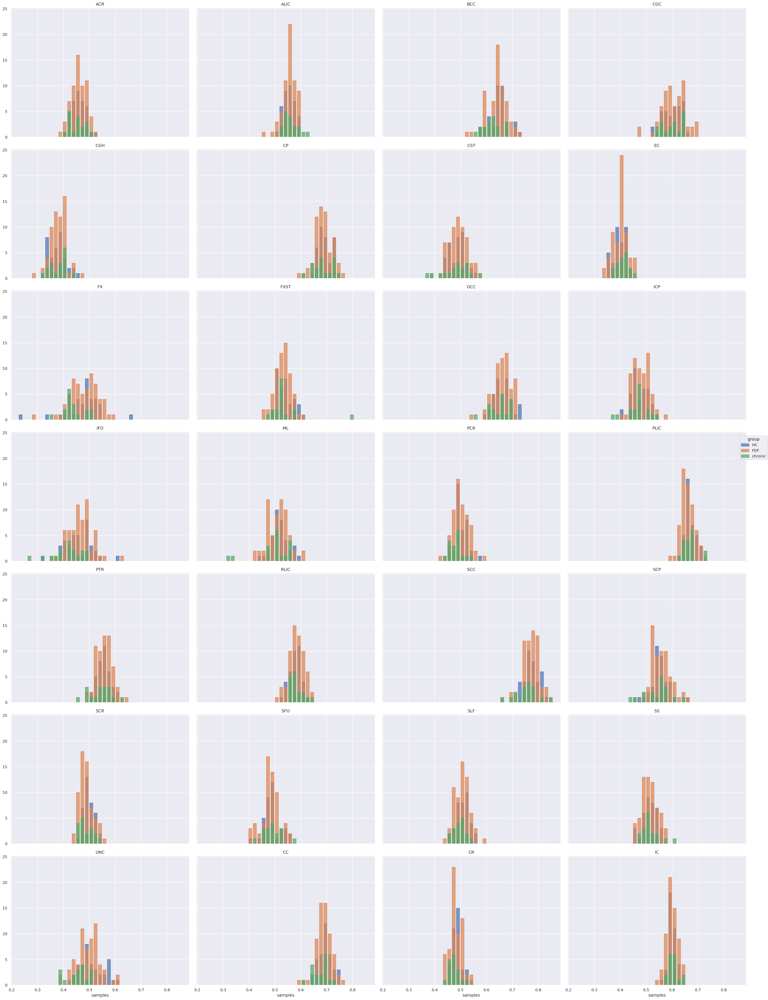

2024-03-19 17:21:04,385 - distributed.client - ERROR - Failed to reconnect to scheduler after 30.00 seconds, closing client


In [45]:
import seaborn.objects as so
(
    so.Plot(fit[["samples", "zscore", "group"]].to_dataframe(), x="samples", color="group")
    .facet("label", wrap=4)
    .add(so.Bar(), so.Hist())
    .layout(size=(30, 40))
)
# sns.histplot(fa["samples"].to_dataframe())

In [4]:
fit = xr.load_dataset("rvi_analysis.nc")

In [36]:
from sklearn import impute
raise KeyboardInterrupt("Consider loading from rvi_analysis.nc or comment this interrupt")
fa = (
    xr.concat([samples, *merged], dim="label")
    .to_dataset(name="samples")
    .rename({"subject": "participant_id"})
    .merge(topsy.metadata, join="inner")
    .rename({"participant_id": "subject"})
    .assign(ic_volume=volume["volume"].sel(session="1").drop_vars("session"))
)

fa["age"].data = (
    impute.SimpleImputer().fit_transform(fa["age"].data.reshape((-1, 1))).ravel()
)

def resid_zscore(da):
    model = smf.ols(
        "samples ~ ic_volume + sex + age", data=da.to_dataframe()
    ).fit()
    da["resid"] = model.resid.to_xarray()
    hcs = da.groupby("group")["HC"]
    mean = hcs["resid"].mean()
    std = hcs["resid"].std()
    da["zscore"] = (da["resid"] - mean) / std
    return da
fit = fa.groupby("label").map(resid_zscore)

KeyboardInterrupt: Consider loading from rvi_analysis.nc

In [35]:
fit.load().to_netcdf("rvi_analysis.nc")

/local/knavynde.17962423.0/tmp/kslurm-venv-g5jmbq42/lib/python3.10/site-packages/distributed/client.py:3162: UserWarning: Sending large graph of size 18.46 MiB.
This may cause some slowdown.
Consider scattering data ahead of time and using futures.
  warnings.warn(


In [8]:
def calc_rvi(ds):
    scores = ds.sel(label=list(effects["ROI"]))
    cohend = effects["Cohen’s d"]
    return xr.DataArray(
        # np.dot(scores, cohend) / np.linalg.norm(scores) / np.linalg.norm(cohend),
        scs.pearsonr(scores.data.ravel(), cohend).statistic,
        dims=("subject",),
        coords={"subject": ds["subject"]},
    )


rvi = fit["zscore"].groupby("subject").map(calc_rvi)

In [19]:
df = rvi.to_dataset(name="rvi").merge(fit["group"].sel(label="ACR").drop_vars("label")).to_dataframe()
smf.ols("rvi ~ group", df).fit().summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                    rvi   R-squared:                       0.009
Model:                            OLS   Adj. R-squared:                 -0.008
Method:                 Least Squares   F-statistic:                    0.5119
Date:                Wed, 20 Mar 2024   Prob (F-statistic):              0.601
Time:                        13:43:45   Log-Likelihood:                -13.228
No. Observations:                 117   AIC:                             32.46
Df Residuals:                     114   BIC:                             40.74
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
====================================================================================
                       coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------
Intercept           -0.0352      0.035     -1.018      0.311      -0.104       0.033
group[T.HC]         -0.0007      0.057     -0.012      0.990      -0.113       0.112
group[T.chronic]     0.0726      0.075      0.968      0.335      -0.076       0.221
==============================================================================
Omnibus:                        2.307   Durbin-Watson:                   1.868
Prob(Omnibus):                  0.316   Jarque-Bera (JB):                1.891
Skew:                           0.171   Prob(JB):                        0.388
Kurtosis:                       2.480   Cond. No.                         3.42
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [47]:
len(effects["ROI"])

24

In [53]:
emperic_hc = fit.groupby("group")["HC"].unstack("stacked_label_subject")["zscore"].groupby(
    "subject"
).map(calc_rvi)

print(emperic_hc.std())
scs.sem(emperic_hc)

<xarray.DataArray ()>
array(0.28309437)


0.04718239447970919

In [56]:
cov = np.cov(
    fit.groupby("group")["HC"]
    .unstack("stacked_label_subject")
    .sel(label=list(effects["ROI"]))["zscore"]
    .data
)
np.std(cov)

0.26685931161157805

In [52]:
from numpy.random import default_rng
n_subs = 39
rng = default_rng()
data = cov @ rng.standard_normal(24 * n_subs).reshape((24, -1))

def _calc_rvi(arr):
    cohend = effects["Cohen’s d"]
    return scs.pearsonr(arr, cohend).statistic
result = np.empty((n_subs,))
for i in range(n_subs):
    result[i] = _calc_rvi(data[:, i])
print(result.std())
scs.sem(result)

0.29349263162777817


0.04761079179406555

<Axes: xlabel='group', ylabel='rvi'>

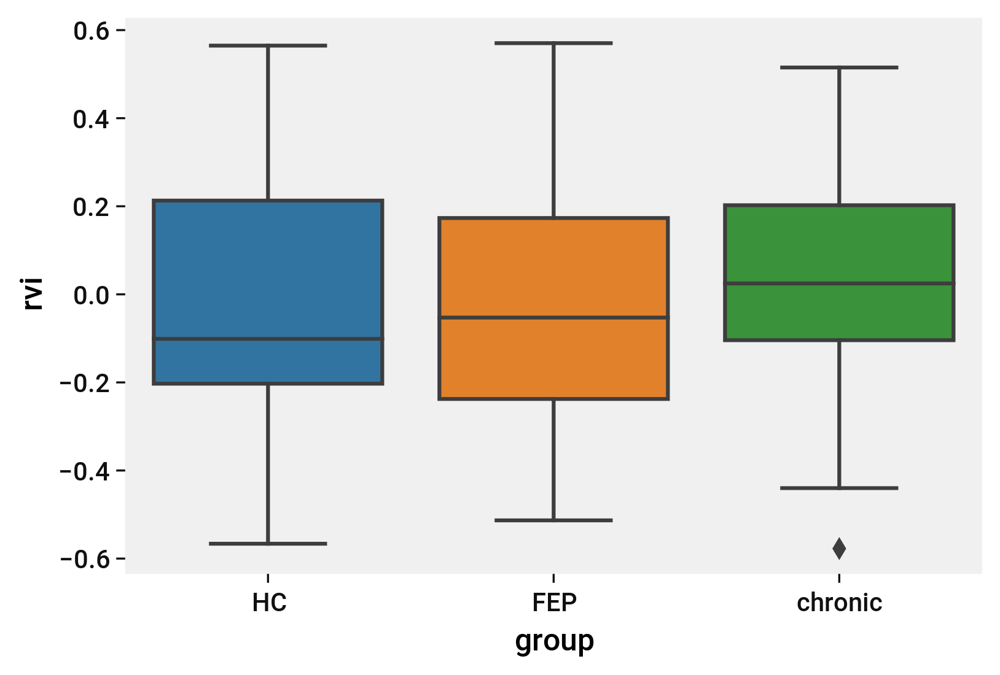

In [22]:
sns.boxplot(fa[["rvi", "group"]].to_dataframe(), x="group", y="rvi")

In [90]:
fit.groupby("group")["HC"].unstack("stacked_label_subject")["zscore"].mean("subject")

<xarray.DataArray 'zscore' (label: 28)>
array([ 7.50150692e-18,  1.20024111e-17,  3.00060277e-18,  2.79431133e-17,
       -3.22564798e-17,  2.40048222e-17, -3.60072332e-17, -1.20024111e-17,
       -3.00060277e-18, -2.25045208e-18,  1.80036166e-17, -4.80096443e-17,
       -3.00060277e-18,  3.00060277e-18, -1.87537673e-19, -3.00060277e-17,
       -4.57591922e-17, -7.50150692e-18,  1.20024111e-17,  3.00060277e-18,
        4.80096443e-17,  3.00060277e-17,  9.00180831e-18,  9.00180831e-18,
       -4.80096443e-17,  7.12643158e-18, -3.30066305e-17,  1.80036166e-17])
Coordinates:
  * label    (label) object 'ACR' 'ALIC' 'BCC' 'CGC' ... 'UNC' 'CC' 'CR' 'IC'
    desc     <U2 'FA'

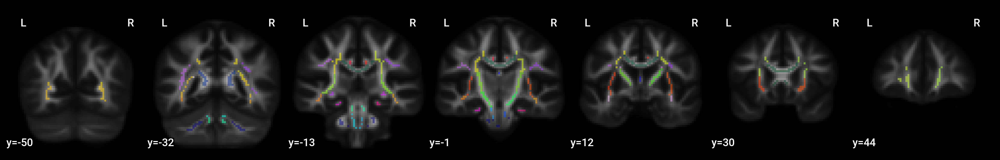

In [53]:
from nilearn import plotting
img = nb.load(layout.get(suffix="skeletonized", desc="FA")[0])

skel = nb.Nifti1Image(atlas, img.affine, img.header)
bg = "../../derivatives/tpl-FA/tpl-study/tpl-study_FA.nii.gz"
# plt.imshow(mean_skeleton.data[60], cmap="Greys_r")

# Demographics

## Excluded Subjects

In [32]:
(
    topsy.metadata.loc[topsy.metadata.index.isin(list(unused | set(used_subs)))]
    .assign(
        used=lambda da: da.index.isin(used_subs),
        Smoking_Index=lambda da: da["Smoking_Index"].where(da["smoker"] == 1, other=0),
        handedness=lambda da: da["HandednessTotal"]
        .where(lambda ds: (ds < -4) | (ds > 4), 0)
        .where(lambda ds: ds < 4, 12)
        .where(lambda ds: (ds > -4), -12)
        .map({12: "R", 0: "A", -12: "L"}),
        antipsychotic_exposure=lambda da: (
            np.where((da["ddd_lifetime"] > 0) | (da["ddd_dayofscan"] > 0), "yes", "no")
        ),
    )
    .fillna({"smoker": "no"})

)

,species,phenotype,sex,DOB,ethnicity,group,age,education,SOFAS,time,...,ddx,ddd_lifetime,ddd_dayofscan,PANSSTOTAL,PANSS8-N,PANSS8-P,PANSS8-G,used,handedness,antipsychotic_exposure
participant_id,,,,,,,,,,,,,,,,,,,,,
001,homo sapiens,HC,M,1990-12-20,White,HC,26.0,18.0,NaN,0.0,...,9.0,0.0,0.00,8.0,3.0,3.0,2.0,True,R,no
002,homo sapiens,HC,M,1990-06-23,White,HC,26.0,14.0,NaN,0.0,...,9.0,0.0,0.00,8.0,3.0,3.0,2.0,True,R,no
003,homo sapiens,HC,M,1991-10-28,NaN,HC,24.0,16.0,NaN,0.0,...,9.0,0.0,0.00,8.0,3.0,3.0,2.0,True,R,no
004,homo sapiens,HC,F,1993-10-16,NaN,HC,23.0,14.0,NaN,0.0,...,9.0,0.0,0.00,8.0,3.0,3.0,2.0,True,R,no
005,homo sapiens,HC,M,1999-11-18,NaN,HC,17.0,11.0,NaN,0.0,...,9.0,0.0,0.00,8.0,3.0,3.0,2.0,True,R,no
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
156,homo sapiens,HC,M,1998-05-16,NaN,HC,23.0,17.0,85.0,0.0,...,9.0,0.0,0.00,8.0,3.0,3.0,2.0,True,R,no
157,homo sapiens,FEP,M,1995-06-01,NaN,FEP,26.0,NaN,40.0,0.0,...,1.0,11.3,1.50,31.0,14.0,11.0,6.0,True,R,yes
158,homo sapiens,chronic,F,2000-08-10,White,chronic,NaN,11.0,51.0,NaN,...,1.0,NaN,0.92,NaN,NaN,NaN,NaN,False,R,yes


In [35]:
used_subs = (
    topsy_hub_data.sel(subject=topsy_hub_data["group"] != "High risk")
    .to_dataframe()
    .index
    .get_level_values("subject")
)
unused = (set(topsy.metadata.index) - set(used_subs)) & set(
    topsy.metadata[topsy.metadata["phenotype"] != "CHR"].index
)
table = DemographicTable(
    topsy.metadata.loc[topsy.metadata.index.isin(list(unused | set(used_subs)))]
    .loc[lambda df: df["group"] == "chronic"]
    .assign(
        used=lambda da: da.index.isin(list(used_subs)),
        Smoking_Index=lambda da: da["Smoking_Index"].where(da["smoker"] == 1, other=0),
        handedness=lambda da: da["HandednessTotal"]
        .where(lambda ds: (ds < -4) | (ds > 4), 0)
        .where(lambda ds: ds < 4, 12)
        .where(lambda ds: (ds > -4), -12)
        .map({12: "R", 0: "A", -12: "L"}),
        antipsychotic_exposure=lambda da: (
            # np.where((da["ddd_lifetime"] > 0) | (da["ddd_dayofscan"] > 0), "yes", "no")
           (da["ddd_lifetime"] > 0) | (da["ddd_dayofscan"] > 0)
        ),
    )
    .fillna({"smoker": "no"}),
    "used",
    [True,False],
)


def capitalize(label):
    return label.replace("_", " ").capitalize()


table.add_nominal("sex", "{M}/{F}", autoformatter=capitalize)
table.add_scale("age", autoformatter=capitalize)
table.add_nominal("handedness", "{R}/{L}/{A}", autoformatter=capitalize)
table.add_scale("education", autoformatter=capitalize)
table.add_scale("SES")
table.add_scale("CAST")
table.add_scale("AUDIT-C")
table.add_nominal("smoker", "{yes}/{no}", autoformatter=capitalize)
table.add_nominal("Cannabis", "{yes}/{no}", autoformatter=capitalize)
table.add_scale("DUP", "DUP (weeks)", report="median", skip_stats=True)
table.add_scale("DUI", "DUI (weeks)", report="median", skip_stats=True)
table.add_nominal(
    "antipsychotic_exposure",
    "{yes}/{no}",
    "Exposed to antipsychotics?",
    skip_stats=True,
    skip_groups=["HC", "chronic"],
)
table.add_scale(
    "ddd_dayofscan",
    "Antipsychotics Day of Scan (Defined Daily Dose)",
    report="median",
    skip_stats=True,
)
table.add_scale(
    "ddd_lifetime",
    "Lifetime Antipsychotics (Defined Daily Dose)",
    report="median",
    skip_stats=True,
)
table.add_scale("SOFAS")
table.add_scale("PANSSTOTAL", "PANSS-8 Total")
table.add_scale("PANSS8-P", "PANSS-8 Positive")
table.add_scale("PANSS8-N", "PANSS-8 Negative")
table.add_scale("PANSS8-G", "PANSS-8 General")
print(table.to_pandas().to_markdown())
table.to_pandas().to_csv("topsy_metadata.csv")

|                                                                | True (n=17)     | False (n=3)   | True vs False               |
|:---------------------------------------------------------------|:----------------|:--------------|:----------------------------|
| Sex (M/F)                                                      | 14/3            | 2/1           | χ²(1) = 0, _p_ = 1          |
| Age                                                            | 28.81 (7.46)    | 30.50 (6.36)  | _t_(16) = -0.304, _p_ = .76 |
| Handedness (R/L/A)                                             | 15/1/1          | 3/0/0         | χ²(2) = 0.392, _p_ = .82    |
| Education                                                      | 12.81 (2.37)    | 13.00 (2.65)  | _t_(17) = -0.124, _p_ = .9  |
| SES                                                            | 3.41 (1.18)     | 2.67 (1.15)   | _t_(18) = 1.01, _p_ = .32   |
| CAST                                                           | 11.93 (7.96)    

In [ ]:
table = DemographicTable(
    topsy_hub_data.sel(subject=topsy_hub_data["group"] != "High risk")
    .assign(
        Smoking_Index=lambda da: da["Smoking_Index"].where(da["smoker"] == 1, other=0),
        handedness=lambda da: da["HandednessTotal"]
        .where(lambda ds: (ds < -4) | (ds > 4), 0)
        .where(lambda ds: ds < 4, 12)
        .where(lambda ds: (ds > -4), -12)
        .to_series()
        .map({12: "R", 0: "A", -12: "L"})
        .to_xarray(),
        antipsychotic_exposure=lambda da: xr.DataArray(
            np.where((da["ddd_lifetime"] > 0) | (da["ddd_dayofscan"] > 0), "yes", "no"),
            coords={"subject": da["subject"]},
        )
    )
    .fillna({"smoker": "no"})
    .drop_dims(["node", "weight"])
    .to_dataframe(),
    "group",
    ["HC", "FEP", "chronic"],
)


def capitalize(label):
    return label.replace("_", " ").capitalize()


table.add_nominal("sex", "{M}/{F}", autoformatter=capitalize)
table.add_scale("age", autoformatter=capitalize)
table.add_nominal("handedness", "{R}/{L}/{A}", autoformatter=capitalize)
table.add_scale("education", autoformatter=capitalize)
table.add_scale("SES")
table.add_scale("CAST")
table.add_scale("AUDIT-C")
table.add_nominal("smoker", "{yes}/{no}", autoformatter=capitalize)
table.add_nominal("Cannabis", "{yes}/{no}", autoformatter=capitalize)
table.add_scale("DUP", "DUP (weeks)", report="median", skip_stats=True)
table.add_scale("DUI", "DUI (weeks)", report="median", skip_stats=True)
table.add_nominal(
    "antipsychotic_exposure",
    "{yes}/{no}",
    "Exposed to antipsychotics?",
    skip_stats=True,
    skip_groups=["HC", "chronic"]
)
table.add_scale(
    "ddd_dayofscan",
    "Antipsychotics Day of Scan (Defined Daily Dose)",
    report="median",
    skip_stats=True,
)
table.add_scale(
    "ddd_lifetime",
    "Lifetime Antipsychotics (Defined Daily Dose)",
    report="median",
    skip_stats=True,
)
table.add_scale("SOFAS")
table.add_scale("PANSSTOTAL", "PANSS-8 Total")
table.add_scale("PANSS8-P", "PANSS-8 Positive")
table.add_scale("PANSS8-N", "PANSS-8 Negative")
table.add_scale("PANSS8-G", "PANSS-8 General")
print(table.to_pandas().to_markdown())
table.to_pandas().to_csv("topsy_metadata.csv")

|                                                                | HC (n=38)    | FEP (n=59)      | chronic (n=17)   | HC vs FEP                       | HC vs chronic                   | FEP vs chronic                  |
|:---------------------------------------------------------------|:-------------|:----------------|:-----------------|:--------------------------------|:--------------------------------|:--------------------------------|
| Sex (M/F)                                                      | 25/13        | 49/10           | 14/3             | χ²(1) = 2.91, _p_ = .088        | χ²(1) = 0.862, _p_ = .35        | χ²(1) = 0, _p_ = 1              |
| Age                                                            | 21.82 (3.51) | 22.75 (4.58)    | 28.81 (7.46)     | _t_(95) = -1.07, _p_ = .29      | _t_(52) = -4.71, **_p_ < .001** | _t_(73) = -4.06, **_p_ < .001** |
| Handedness (R/L/A)                                             | 35/0/3       | 51/1/7          | 15/1/1          

In [11]:
table = DemographicTable(
    hcp_hub_data.assign(
        pack_years=hcp_hub_data["smoke_time"] * hcp_hub_data["smoke_amount"] / 20
    )
    .fillna({"antipsychotic_dur": 0, "total_defined_daily_dose": 0})
    .drop_dims(["node", "weight"])
    .to_dataframe(),
    "group",
)


def capitalize(label):
    return label.replace("_", " ").capitalize()


table.add_nominal("sex", "{M}/{F}", autoformatter=capitalize)
table.add_scale("education", autoformatter=capitalize)
table.add_scale("age", autoformatter=capitalize)
table.add_nominal("handedness", "{R}/{L}", autoformatter=capitalize)
table.add_scale("SES")
table.add_nominal("smoke", "{Yes}/{No}", autoformatter=capitalize)
table.add_scale("pack_years", autoformatter=capitalize)
table.add_scale("cannabis_exposure", "Cannabis", skip_stats=True)
table.add_scale("antipsychotic_dur", "Antipsychotic Duration (months)", skip_stats=True)
table.add_scale(
    "total_defined_daily_dose",
    "Lifetime Antipsychotics (Defined Daily Dose)",
    skip_stats=True,
)
table.add_scale("panss-total", "PANSS Total", skip_stats=True)
table.add_scale("PANSS-P", "PANSS Positive", skip_stats=True)
table.add_scale("PANSS-N", "PANSS Negative", skip_stats=True)
table.add_scale("PANSS-G", "PANSS Global", skip_stats=True)

# Not sufficient data to report alcohol
print(table.to_pandas().to_markdown())

|                                              | HC (n=54)    | Patient (n=57)   | HC vs Patient                   |
|:---------------------------------------------|:-------------|:-----------------|:--------------------------------|
| Sex (M/F)                                    | 35/19        | 43/14            | χ²(1) = 1.03, _p_ = .31         |
| Education                                    | 15.96 (1.92) | 13.29 (1.31)     | _t_(39) = 4.95, **_p_ < .001**  |
| Age                                          | 24.89 (4.15) | 21.84 (2.82)     | _t_(109) = 4.54, **_p_ < .001** |
| Handedness (R/L)                             | 43/10        | 52/3             | χ²(1) = 3.41, _p_ = .065        |
| SES                                          | 2.06 (1.05)  | 2.52 (1.24)      | _t_(107) = -2.1, **_p_ = .038** |
| Smoke (Yes/No)                               | 3/49         | 11/46            | χ²(1) = 3.32, _p_ = .068        |
| Pack years                                   | 0.02 (0.10)  | 

In [12]:
table = DemographicTable(
    topsy_hub_data.sel(
        subject=(
            topsy_hub_data.where(topsy_hub_data["group"].isin(["HC", "chronic"]))
            .where(topsy_hub_data["age"] >= 24, drop=True)
            ["group"]
            .dropna("subject")
            ["subject"]
        )
    )
    .assign(
        Smoking_Index=lambda da: da["Smoking_Index"].where(da["smoker"] == 1, other=0),
        handedness=lambda da: da["HandednessTotal"]
        .where(lambda ds: (ds < -4) | (ds > 4), 0)
        .where(lambda ds: ds < 4, 12)
        .where(lambda ds: (ds > -4), -12)
        .to_series()
        .map({12: "R", 0: "A", -12: "L"})
        .to_xarray(),
    )
    .fillna({"ddd_dayofscan": 0, "smoker": "no"})
    .drop_dims(["node", "weight"])
    .to_dataframe(),
    "group",
    ["HC", "chronic"],
)



def capitalize(label):
    return label.replace("_", " ").capitalize()


table.add_nominal("sex", "{M}/{F}", autoformatter=capitalize)
table.add_scale("age", autoformatter=capitalize)
table.add_nominal("handedness", "{R}/{L}", autoformatter=capitalize)
table.add_scale("education", autoformatter=capitalize)
table.add_scale("SES")
table.add_scale("CAST")
table.add_scale("AUDIT-C")
table.add_scale(
    "ddd_dayofscan",
    "Antipsychotics Day of Scan (Defined Daily Dose)",
    report="median",
    skip_stats=True,
)
table.add_nominal("smoker", "{yes}/{no}", autoformatter=capitalize)
table.add_nominal("Cannabis", "{yes}/{no}", autoformatter=capitalize)
table.add_scale("SOFAS")
table.add_scale("PANSSTOTAL", "PANSS-8 Total")
table.add_scale("PANSS8-P", "PANSS-8 Positive")
table.add_scale("PANSS8-N", "PANSS-8 Negative")
table.add_scale("PANSS8-G", "PANSS-8 General")
print(table.to_pandas().to_markdown())

|                                                                | HC (n=9)     | chronic (n=13)   | HC vs chronic                   |
|:---------------------------------------------------------------|:-------------|:-----------------|:--------------------------------|
| Sex (M/F)                                                      | 7/2          | 11/2             | χ²(1) = 0, _p_ = 1              |
| Age                                                            | 26.44 (1.94) | 30.54 (7.23)     | _t_(20) = -1.65, _p_ = .12      |
| Handedness (R/L)                                               | 9/0          | 12/1             | χ²(1) = 0, _p_ = 1              |
| Education                                                      | 15.33 (2.06) | 12.69 (2.46)     | _t_(20) = 2.64, **_p_ = .016**  |
| SES                                                            | 3.89 (1.05)  | 3.54 (1.20)      | _t_(20) = 0.707, _p_ = .49      |
| CAST                                                 

/scratch/knavynde/topsy/code/prepdwi-recon/notebooks/demographics.py:183: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  test = scs.ttest_ind(vals1, vals2, nan_policy="omit")
/scratch/knavynde/topsy/code/prepdwi-recon/notebooks/demographics.py:183: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  test = scs.ttest_ind(vals1, vals2, nan_policy="omit")
/scratch/knavynde/topsy/code/prepdwi-recon/notebooks/demographics.py:183: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  test = scs.ttest_ind(vals1, vals2, nan_policy="omit")
/scratch/knavynde/topsy/code/prepdwi-recon/notebooks/demographics.py:183: RuntimeWarning: Precisi

# Figures

## Voxelwise

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

HC vs. chronic: Custom statistical test, P_val:1.716e-03
p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

FEP vs. chronic: Custom statistical test, P_val:3.569e-02
HC vs. chronic: Custom statistical test, P_val:1.318e-03
p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

HC vs. chronic: Custom statistical test, P_val:2.694e-02


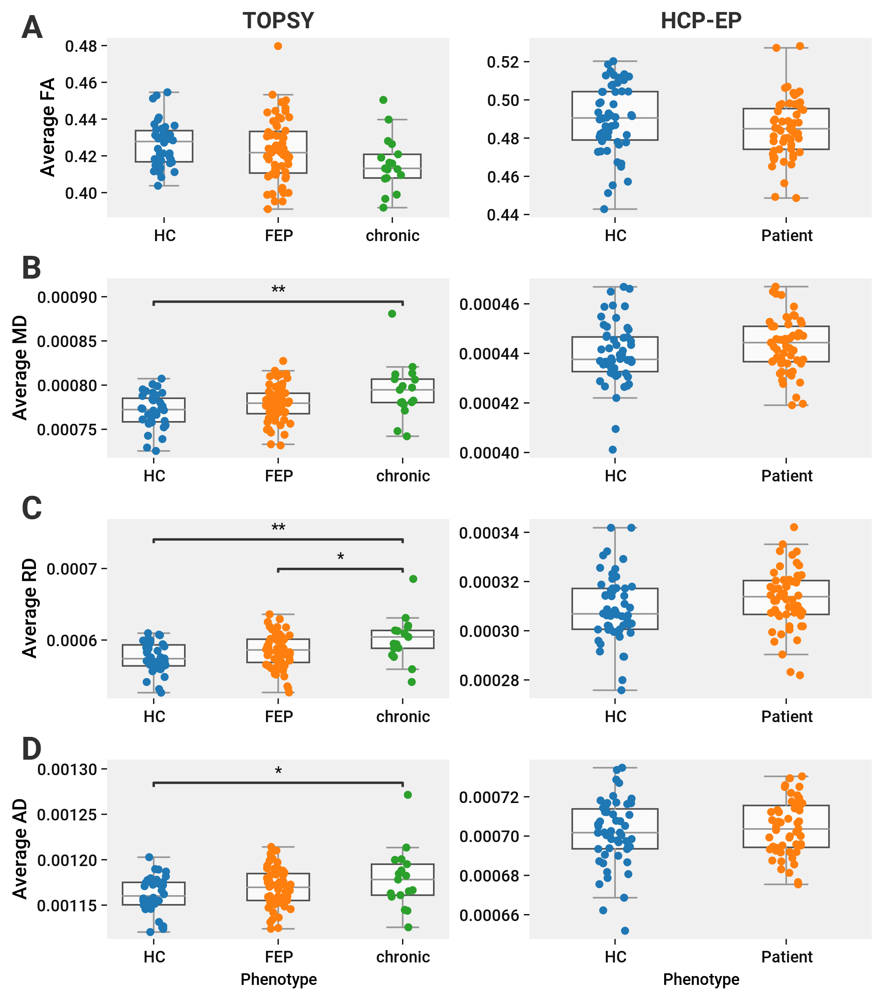

In [19]:
import statsmodels.api as sm
from statsmodels.formula.api import ols
from statsmodels.stats.multicomp import pairwise_tukeyhsd

topsy_global_vox = topsy_conmats.mean(["src", "dest"])


def do_global_test(_data, weight, _order=None):
    class Results:
        data = _data.sel(weight=weight).to_dataframe()
        model = ols("adj ~ C(phenotype)", data=data).fit()
        res = pairwise_tukeyhsd(endog=data["adj"], groups=data["phenotype"], alpha=0.05)
        order = _order

        @classmethod
        def plot(cls, ax):
            return comparison_plot(
                cls.data, order=cls.order, ax=ax, significance=cls.res
            )

        @classmethod
        def summary(cls):
            return "\n".join(
                [cls.model.summary().as_text(), cls.res.summary().as_text()]
            )

    return Results


class TopsyGlobals:
    fa = do_global_test(topsy_global_vox, "avgFA", ["HC", "FEP", "chronic"])
    md = do_global_test(topsy_global_vox, "avgMD", ["HC", "FEP", "chronic"])
    rd = do_global_test(topsy_global_vox, "avgRD", ["HC", "FEP", "chronic"])
    ad = do_global_test(topsy_global_vox, "avgL1", ["HC", "FEP", "chronic"])


statresults.add_f("global-params_fa", TopsyGlobals.fa.model)
statresults.add_p("global-params_fa_hc_chronic", TopsyGlobals.fa.res.pvalues[2])
statresults.add_f("global-params_md", TopsyGlobals.md.model)
statresults.add_p("global-params_md_hc_chronic", TopsyGlobals.md.res.pvalues[2])
statresults.add_p("global-params_md_fep_chronic", TopsyGlobals.md.res.pvalues[1])
statresults.add_f("global-params_rd", TopsyGlobals.rd.model)
statresults.add_p("global-params_rd_hc_chronic", TopsyGlobals.rd.res.pvalues[2])
statresults.add_p("global-params_rd_fep_chronic", TopsyGlobals.rd.res.pvalues[1])
statresults.add_f("global-params_ad", TopsyGlobals.ad.model)
statresults.add_p("global-params_ad_hc_chronic", TopsyGlobals.ad.res.pvalues[2])

hcp_global_vox = hcp_conmats.mean(["src", "dest"])


class HcpGlobals:
    fa = do_global_test(hcp_global_vox, "avgFA")
    md = do_global_test(hcp_global_vox, "avgMD")
    rd = do_global_test(hcp_global_vox, "avgRD")
    ad = do_global_test(hcp_global_vox, "avgL1")


fig = plt.figure(figsize=(7.5, 8.5), layout="constrained")
grid = fig.add_gridspec(1, 1, height_ratios=[1])
panel = fig.add_subfigure(grid[0])
axs = panel.subplots(4, 2)

# Col 1
for j, col, dataset, col_title in zip(
    range(2), axs.T, [TopsyGlobals, HcpGlobals], ["TOPSY", "HCP-EP"]
):
    for i, results, panel_label, ylabel, ax in zip(
        range(20),
        [dataset.fa, dataset.md, dataset.rd, dataset.ad],
        ["A", "B", "C", "D"],
        ["Average FA", "Average MD", "Average RD", "Average AD"],
        col,
    ):
        if not i:
            ax.set_title(col_title, **Styles.col_title)
        if not j:
            ax.text(-0.25, 1, panel_label, transform=ax.transAxes, **Styles.panel_label)
        order = ["HC", "FEP", "chronic"]
        results.plot(ax)
        if not j:
            ax.set_ylabel(ylabel)
        else:
            ax.set_ylabel(None)
        if i < 3:
            ax.set_xlabel(None)


In [21]:
from nilearn import plotting

bkg = topsy.get(
    scope="templategen",
    subject=None,
    suffix="FA",
    extension=".nii.gz",
)[0].path

from bids import BIDSLayout, BIDSLayoutIndexer

# reindex to grab files in sourcedata
stats = BIDSLayout(
    Path(topsy.layout.derivatives["snakemodel"].root),
    indexer=BIDSLayoutIndexer(ignore=[".git", ".snakemake"]),
    validate=False,
    is_derivative=True,
)

md_cmap = "Wistia"
rd_cmap="winter"
ad_cmap="summer"

def get_display(cut_coords):
    return plotting.plot_anat(
        bkg,
        colorbar=False,
        display_mode="z",
        cut_coords=cut_coords,
        # title="FEP vs Chronic",
    )

def to_square(arr):
    return np.vstack([arr[:, :arr.shape[1]//2], arr[:, arr.shape[1]//2:]])



display = get_display(cut_coords=[-13])
display.add_overlay(
    stats.get(
        scope="snakemodel",
        subject=None,
        model="tbss",
        desc="md",
        label="fepI",
        suffix="filled",
    )[0].path,
    cmap=md_cmap,
)
display.close()
fep_md = fig_to_numpy(display.frame_axes.figure)

display = get_display(cut_coords=[-5])
display.add_overlay(
    stats.get(
        scope="snakemodel",
        subject=None,
        model="tbss",
        desc="rd",
        label="chronicI",
        suffix="filled",
    )[0].path,
    cmap=rd_cmap,
)
display.close()
chronicI_rd = fig_to_numpy(display.frame_axes.figure)

/local/knavynde.18227069.0/tmp/kslurm-venv-c529tad7/lib/python3.10/site-packages/nilearn/plotting/displays/_slicers.py:383: UserWarning: empty mask
  get_mask_bounds(new_img_like(img, not_mask, affine))
/local/knavynde.18227069.0/tmp/kslurm-venv-c529tad7/lib/python3.10/site-packages/numpy/ma/core.py:2826: UserWarning: Warning: converting a masked element to nan.
  _data = np.array(data, dtype=dtype, copy=copy,


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

HC vs. chronic: Custom statistical test, P_val:3.615e-02
p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

HC vs. chronic: Custom statistical test, P_val:1.972e-02
p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

Patient vs. HC: Custom statistical test, P_val:1.706e-02
p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

Patient vs. HC: Custom statistical test, P_val:3.088e-02


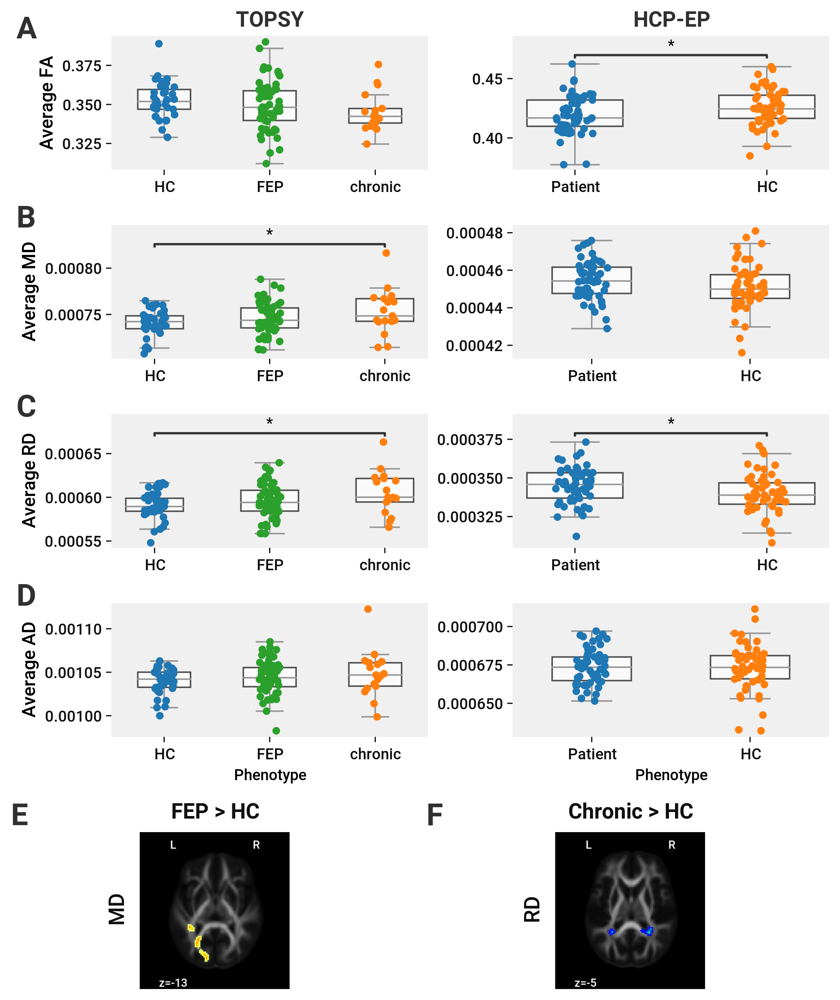

In [73]:
import statsmodels.api as sm
from statsmodels.formula.api import ols
from statsmodels.stats.multicomp import pairwise_tukeyhsd

topsy_global_vox = topsy_wm.sel(
    subject=topsy_wm["group"].isin(["HC", "FEP", "chronic"])
)


def do_global_test(_data, weight, _order=None, ttest=None):
    class Results:
        data = _data.sel(desc=weight).to_dataframe()
        model = ols("data ~ C(group)", data=data).fit()
        res = pairwise_tukeyhsd(endog=data["data"], groups=data["group"], alpha=0.05)
        order = _order

        @classmethod
        def plot(cls, ax):
            return comparison_plot(
                cls.data, order=cls.order, ax=ax, significance=cls.res, y="data"
            )

        @classmethod
        def summary(cls):
            return "\n".join(
                [cls.model.summary().as_text(), cls.res.summary().as_text()]
            )

    return Results


class TopsyVoxelGlob:
    fa = do_global_test(topsy_global_vox, "FA", ["HC", "FEP", "chronic"])
    md = do_global_test(topsy_global_vox, "MD", ["HC", "FEP", "chronic"])
    rd = do_global_test(topsy_global_vox, "RD", ["HC", "FEP", "chronic"])
    ad = do_global_test(topsy_global_vox, "L1", ["HC", "FEP", "chronic"])


hcp_global_vox = hcp_wm


class HcpVoxelGlob:
    ttest = [[0, 1]]
    fa = do_global_test(hcp_global_vox, "FA", ttest=ttest)
    md = do_global_test(hcp_global_vox, "MD", ttest=ttest)
    rd = do_global_test(hcp_global_vox, "RD", ttest=ttest)
    ad = do_global_test(hcp_global_vox, "L1", ttest=ttest)

statresults.add_f("global-vox_md", TopsyVoxelGlob.md.model)
statresults.add_p("global-vox_md_hc_chronic", TopsyVoxelGlob.md.res.pvalues[2])
statresults.add_f("global-vox_rd", TopsyVoxelGlob.rd.model)
statresults.add_p("global-vox_rd_hc_chronic", TopsyVoxelGlob.rd.res.pvalues[2])
statresults.add_t("global-vox-hcp_fa_chronic", HcpVoxelGlob.fa.model.t_test([[0, 1]]))
statresults.add_f("global-vox-hcp_rd", HcpVoxelGlob.rd.model)
statresults.add_t("global-vox-hcp_rd_chronic", HcpVoxelGlob.rd.model.t_test([[0, 1]]))

fig = plt.figure(figsize=(7.5, 9), layout="constrained")
grid = fig.add_gridspec(2, 1, height_ratios=[4, 1])
panel = fig.add_subfigure(grid[0])
axs = panel.subplots(4, 2)

# Col 1
for j, col, dataset, col_title in zip(
    range(2), axs.T, [TopsyVoxelGlob, HcpVoxelGlob], ["TOPSY", "HCP-EP"]
):
    for i, results, panel_label, ylabel, ax in zip(
        range(20),
        [dataset.fa, dataset.md, dataset.rd, dataset.ad],
        ["A", "B", "C", "D"],
        ["Average FA", "Average MD", "Average RD", "Average AD"],
        col,
    ):
        if not i:
            ax.set_title(col_title, **Styles.col_title)
        if not j:
            ax.text(
                -0.3, 0.98, panel_label, transform=ax.transAxes, **Styles.panel_label
            )
        order = ["HC", "FEP", "chronic"]
        results.plot(ax)
        ax.set_ylabel(ylabel)
        if not j:
            ax.set_ylabel(ylabel)
        else:
            ax.set_ylabel(None)
        if i < 3:
            ax.set_xlabel(None)

panel = fig.add_subfigure(grid[1])
grid = panel.add_gridspec(1, 2, width_ratios=[1, 1])


def set_axis(ax, label):
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_tick_params(length=0)
    ax.get_yaxis().set_ticklabels([])
    ax.set_ylabel(label, color="#101010", size=14)


panel_a = panel.add_subfigure(grid[0])
panel_a.text(0, 0.98, "E", va="top", **Styles.panel_label)
panel_a.suptitle("FEP > HC")
ax = panel_a.add_subplot(111)
ax.imshow(fep_md)
set_axis(ax, "MD")

panel_b = fig.add_subfigure(grid[1])
panel_b.text(0, 0.98, "F", va="top", **Styles.panel_label)
panel_b.suptitle("Chronic > HC")
axs = panel_b.subplots(1, 1)
# axs[0].imshow(chronicI_md)
# set_axis(axs[0], "MD")

axs.imshow(chronicI_rd)
set_axis(axs, "RD")

We defined a composite hubness score using 4 individual measures of hubness: degree, betweenness, clustering coefficient, and shortest path length. Each node in each individual subject was rank-ordered with respect to each of the four metrics and assigned a score between 0 and 1 corresponding to the rank. These scores were summed together to get a hubness score between 0 and 4. Rank-ordering the nodes of each subject by hubness score gives the hubness rank for each subject. The hubness ranking varied little across the subjects (figure TBD).


The hubness scores from each subject were averaged to get the group hubness scores for each node. The group-wise hubness rankings are compared below.

Note that if, instead of the subject-wise analysis described above, the subject connectomes are first combined into group-consensus connectivity matrices, a large amount of difference manifests between groups, especially when FA is used as the weight (figure TBD)

In [22]:
statresults

global-vox-hcp_fa: '$F(1,\, 109) = 5.87,\: p = .017$'
global-vox-hcp_fa_chronic: $t(109) = -2.42, p = .017$
global-vox-hcp_rd: '$F(1,\, 109) = 4.78,\: p = .031$'
global-vox-hcp_rd_chronic: $t(109) = 2.19, p = .031$
global-vox_md: '$F(2,\, 109) = 3.45,\: p = .035$'
global-vox_md_hc_chronic: $p = .03$
global-vox_rd: '$F(2,\, 109) = 4.04,\: p = .020$'
global-vox_rd_hc_chronic: $p = .016$

## Connectivity

In [25]:
def get_deg_maps(nbs):
    g = gt.Graph(directed=False)
    g.add_vertex(nbs.shape[0])
    g.add_edge_list(np.array(np.nonzero(nbs)).T)
    return g.degree_property_map("total").a


deg_maps = [
    get_deg_maps(topsy_nbs.sel(model=model, weight="avgFA"))
    for model in ["fep", "chronic", "fep2chronic"]
] + [get_deg_maps(hcp_nbs.sel(model="patient", weight="avgFA"))]
vmaxes = [np.max(deg_map) for deg_map in deg_maps]
deg_ims = [
    plot_on_atlas(deg_map, transparent=True, vmax=vmax)
    for deg_map, vmax in zip(deg_maps, vmaxes)
]

In [26]:
disruption_by_hubness = pd.concat(
    [
        get_disruption_by_hubness(
            hubness=topsy_hub_data
            .sel(weight="logsift2")
            .groupby('group')["HC"]["hubness"]
            .mean('subject'),
            nbs=symmetrize(topsy_nbs.sel(model=model, weight='avgFA')),
            upper=0.90,
            lower=0.1,
            res=0.02,
            kernel=0.05,
            seed=2,
            normalize=False
        ).assign(model=model)
        for model in ["fep", 'chronic', 'fep2chronic']
    ] +
    [
        get_disruption_by_hubness(
            hubness=hcp_hub_data
            .sel(weight="logsift2")
            .groupby('group')["HC"]["hubness"]
            .mean('subject'),
            nbs=symmetrize(hcp_nbs.sel(model="patient", weight='avgFA')),
            upper=0.90,
            lower=0.1,
            res=0.02,
            kernel=0.05,
            seed=2,
            normalize=False
        ).assign(model="patient")
    ]
)

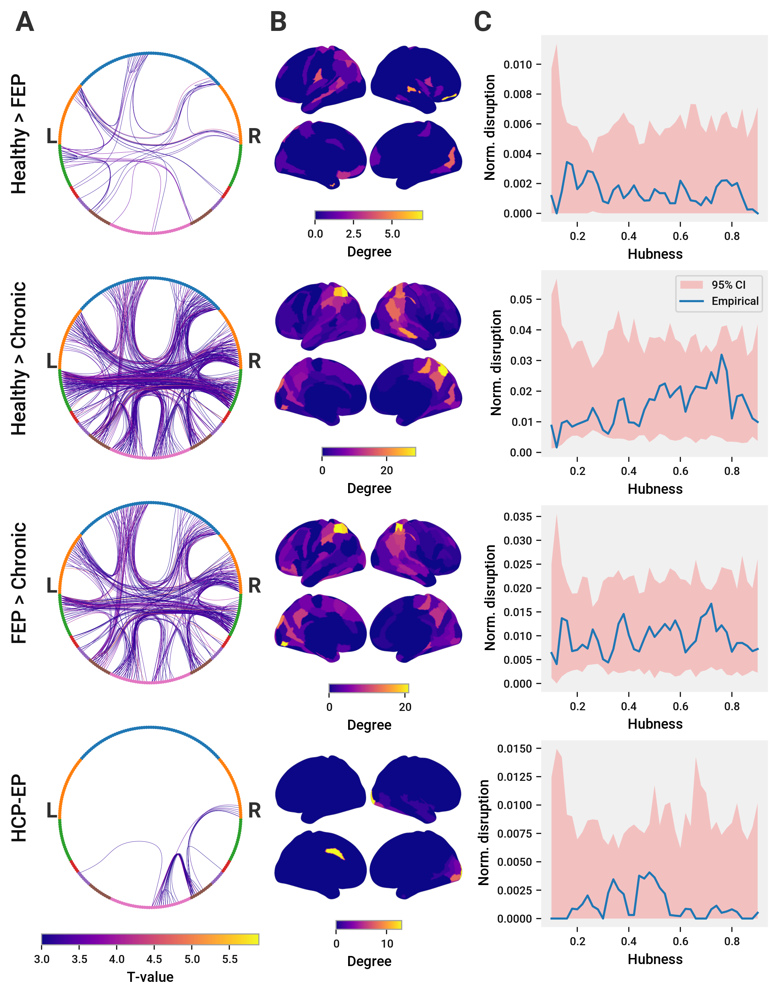

In [27]:
plt.switch_backend("cairo")
fig = plt.figure(layout="constrained", figsize=(7.5, 9.5))
grid = fig.add_gridspec(1, 3, width_ratios=[2.5, 2, 3])

panel_b = fig.add_subfigure(grid[0])
panel_b.text(0, 1, "A", **Styles.panel_label)
axs_a = panel_b.subplots(5, 1, height_ratios=[1, 1, 1, 1, 0.05])
max_t = np.max([np.max(hcp_nbs), np.max(topsy_nbs)])

for ax, nbs, model, title in zip(
    axs_a[:-1],
    [topsy_nbs, topsy_nbs, topsy_nbs, hcp_nbs],
    ["fep", "chronic", "fep2chronic", "patient"],
    ["Healthy > FEP", "Healthy > Chronic", "FEP > Chronic", "HCP-EP"],
):
    arr = nbs.sel(model=model, weight="avgFA").to_masked_array().filled(0)
    plot_hierachical_connectome(
        arr, ax=ax, ecmap=cm.plasma, vcmap=cm.tab10, atlas=Atlas.bn246, emax=max_t
    )
    ax.set_title(title, rotation="vertical", x=-0.1, y=0.5, va="center")
    ax.axis("off")


cbar = axs_a[-1]
# fig.colorbar(cm.ScalarMappable(Normalize(3, max_t), cmap["plasma"]), orientation="vertical", cax=cbar).set_label('T-value')
add_colorbar(3, max_t, "plasma", cax=cbar, orientation="horizontal").set_label(
    "T-value", fontsize=10
)
cbar.yaxis.set_visible(False)
cbar.xaxis.set_tick_params(labelsize=8)

# add_legend(
#     panel_b,
#     labels=Atlas.bn246["Lobe"].unique(),
#     cmap=cm.tab10,
#     prop={"size": 8},
#     bbox_to_anchor=(0.55, 0.23),
#     loc="lower center",
# )


panel_c = fig.add_subfigure(grid[1])
panel_c.text(0, 1, "B", **Styles.panel_label)
# panel_b.set_facecolor("#f0f0f0")
cols = panel_c.subfigures(5, 1, height_ratios=[1, 1, 1, 1, 0.05])
for deg_im, vmax, col in zip(deg_ims, vmaxes, cols):
    col_grid = col.add_gridspec(
        2, 3, width_ratios=[0.1, 1, 0.1], height_ratios=[0.95, 0.05]
    )
    cbar = col.add_subplot(col_grid[1, 1])
    ax = col.add_subplot(col_grid[0, :])
    ax.imshow(deg_im)
    add_colorbar(0, vmax, "plasma", cax=cbar, orientation="horizontal").set_label(
        "Degree", **Styles.colorbar_label
    )
    cbar.xaxis.set_tick_params(labelsize=8)
    ax.axis("off")

panel_a = fig.add_subfigure(grid[2])
panel_a.text(0, 1, "C", **Styles.panel_label)
axs_c = panel_a.subplots(5, 1, height_ratios=[1,1, 1, 1, 0.05])
axs_c[-1].axis("off")


for ax, model in zip(
    axs_c,
    ["fep", "chronic", "fep2chronic", "patient"],
):
    d = disruption_by_hubness[disruption_by_hubness["model"] == model]
    plot_disruption_topology(d, ax, legend=model == "chronic")

In [28]:
def get_deg_maps(nbs):
    g = gt.Graph(directed=False)
    g.add_vertex(nbs.shape[0])
    g.add_edge_list(np.array(np.nonzero(nbs)).T)
    return g.degree_property_map("total").a


deg_maps = [
    get_deg_maps(topsy_nbs.sel(model=model, weight="sift2"))
    for model in ["fep", "chronic", "fep2chronic"]
] + [get_deg_maps(hcp_nbs.sel(model="patient", weight="sift2"))]
vmaxes = [np.max(deg_map) for deg_map in deg_maps]
deg_ims = [
    plot_on_atlas(deg_map, transparent=True, vmax=vmax)
    for deg_map, vmax in zip(deg_maps, vmaxes)
]

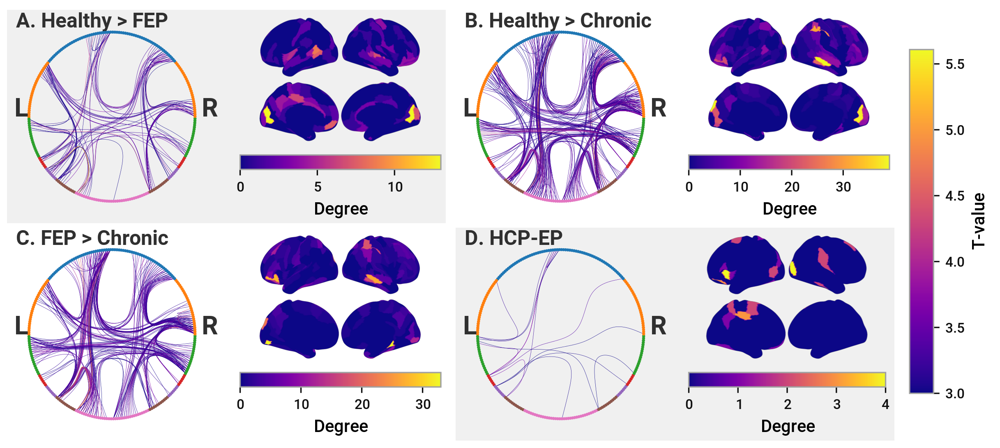

In [35]:
fig = plt.figure(figsize=(8, 3.5), layout="constrained")
grid = fig.add_gridspec(1, 2, width_ratios=[4, 0.4])
gutter = fig.add_subfigure(grid[1])
main = fig.add_subfigure(grid[0])
panels = main.subfigures(2, 2)
# panel_d.text(0, 0.98, "C", verticalalignment="top", **Styles.panel_label)
# panel_d.suptitle("TOPSY", x=0, y=0.5, **Styles.row_title)
# axs = panel_d.subplots(1, 3)
# subfigs = fig.subfigures(1, 2)
# axs = subfigs[0].subplots(2, 2, subplot_kw={"projection": "3d"})
max_t = np.max(
    [
        np.ma.max(topsy_nbs.sel(weight="sift2").to_masked_array()),
        np.ma.max(hcp_nbs.sel(weight="sift2").to_masked_array()),
    ]
)
letters = ["A", "B", "C", "D"]
for i, panel, data, model, title in zip(
    range(4),
    panels.flatten(),
    [topsy_nbs, topsy_nbs, topsy_nbs, hcp_nbs],
    ["fep", "chronic", "fep2chronic", "patient"],
    ["Healthy > FEP", "Healthy > Chronic", "FEP > Chronic", "HCP-EP"],
):
    subpanels = panel.subfigures(1, 2)
    panel.suptitle(
        f"{letters[i]}. {title}",
        x=0.02,
        y=0.99,
        ha="left",
        va="top",
        **dict(Styles.col_title, size=12),
    )
    graph_ax = subpanels[0].subplots(1, 1)
    arr = data.sel(model=model, weight="sift2").to_masked_array().filled(0)
    plot_hierachical_connectome(
        arr, ax=graph_ax, ecmap=cm.plasma, vcmap=cm.tab10, atlas=Atlas.bn246, emax=max_t
    )
    graph_ax.axis("off")
    right_grid = subpanels[1].add_gridspec(10, 1)
    deg_ax = subpanels[1].add_subplot(right_grid[:-1])
    cbar = subpanels[1].add_subplot(right_grid[-1])
    deg_ax.imshow(deg_ims[i])
    deg_ax.axis("off")
    add_colorbar(0, vmaxes[i], "plasma", cax=cbar, orientation="horizontal").set_label(
        "Degree", **Styles.colorbar_label
    )
    cbar.xaxis.set_tick_params(labelsize=8)
panels[0, 0].set_facecolor("#f0f0f0")
panels[1, 1].set_facecolor("#f0f0f0")


gutter_grid = gutter.add_gridspec(3, 1, height_ratios=[1, 10, 1])
cbar = gutter.add_subplot(gutter_grid[1])
# # fig.colorbar(cm.ScalarMappable(Normalize(3, max_t), cmap["plasma"]), orientation="vertical", cax=cbar).set_label('T-value')
add_colorbar(3, max_t, "plasma", cax=cbar, orientation="vertical").set_label(
    "T-value", fontsize=10
)
cbar.xaxis.set_visible(False)
cbar.yaxis.set_tick_params(labelsize=8)

## Topology

In [40]:
imgs = [
    np.asarray(
        plot_on_atlas(
            topsy_hub_data.sel(weight="logsift2")
            .groupby("group")["HC"]["hubness"]
            .mean("subject"),
            vmax=1,
            transparent=True,
        )
    ),
    np.asarray(
        plot_on_atlas(
            hcp_hub_data.sel(weight="logsift2")
            .groupby("group")["HC"]["hubness"]
            .mean("subject"),
            vmax=1,
            transparent=True,
        )
    ),
]

In [36]:
import statsmodels.api as sm
from statsmodels.formula.api import ols
from statsmodels.stats.multicomp import pairwise_tukeyhsd

topsy_global_ = topsy_global[topsy_global["phenotype"] != "CHR"]

topsy_lm_degree = ols("degree ~ C(phenotype)", data=topsy_global_).fit()
hcp_lm_degree = ols("degree ~ C(phenotype)", data=hcp_global).fit()
topsy_lm_eff = ols("global_eff ~ C(phenotype)", data=topsy_global_).fit()
hcp_lm_eff = ols("global_eff ~ C(phenotype)", data=hcp_global).fit()

# sm.stats.anova_lm(adj_lm, typ=2)

topsy_lm_degree_tukey = pairwise_tukeyhsd(
    endog=topsy_global_["degree"], groups=topsy_global_["phenotype"], alpha=0.05
)
topsy_lm_eff_tukey = pairwise_tukeyhsd(
    endog=topsy_global_["global_eff"], groups=topsy_global_["phenotype"], alpha=0.05
)
statresults.add_f("topology_degree", topsy_lm_degree)
statresults.add_p("topology_degree_hc_chronic", topsy_lm_degree_tukey.pvalues[2])
statresults.add_p("topology_degree_hc_fep", topsy_lm_degree_tukey.pvalues[0])
statresults.add_f("topology_eff", topsy_lm_eff)
statresults.add_p("topology_eff_hc_chronic", topsy_lm_degree_tukey.pvalues[2])

print(topsy_lm_degree.summary())
print(hcp_lm_degree.summary())
print(topsy_lm_eff.summary())
print(hcp_lm_eff.summary())

print(topsy_lm_degree_tukey.summary())
topsy_lm_eff_tukey.summary()


                            OLS Regression Results                            
Dep. Variable:                 degree   R-squared:                       0.105
Model:                            OLS   Adj. R-squared:                  0.089
Method:                 Least Squares   F-statistic:                     6.516
Date:                Sat, 30 Mar 2024   Prob (F-statistic):            0.00211
Time:                        08:42:16   Log-Likelihood:                -485.13
No. Observations:                 114   AIC:                             976.3
Df Residuals:                     111   BIC:                             984.5
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
                              coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------
Intercept                 

group1,group2,meandiff,p-adj,lower,upper,reject
FEP,HC,0.0177,0.0859,-0.0019,0.0373,False
FEP,chronic,-0.0171,0.2654,-0.043,0.0089,False
HC,chronic,-0.0347,0.0092,-0.0622,-0.0073,True


In [37]:
data_topsy = topsy_hub_data.sel(weight="logsift2").groupby("group")

kt_intra_topsy = compute_kendalltau_distances(
    topsy_hub_data.sel(
        weight="logsift2", subject=topsy_hub_data["group"] != "High risk"
    )["hubness"]
)

data_hcp = hcp_hub_data.sel(weight="logsift2").groupby("group")

kt_intra_hcp = compute_kendalltau_distances(
    hcp_hub_data.sel(weight="logsift2")["hubness"]
)


class hubness_intragroup:
    hc_to_fep = compare_hubness_intragroup(
        data_topsy["HC"]["subject"], data_topsy["FEP"]["subject"], kt_intra_topsy
    )
    hc_to_chronic = compare_hubness_intragroup(
        data_topsy["HC"]["subject"], data_topsy["chronic"]["subject"], kt_intra_topsy
    )
    fep_to_chronic = compare_hubness_intragroup(
        data_topsy["FEP"]["subject"], data_topsy["chronic"]["subject"], kt_intra_topsy
    )

    hcp_patient_to_hc = compare_hubness_intragroup(
        data_hcp["HC"]["subject"], data_hcp["Patient"]["subject"], kt_intra_hcp
    )


statresults.add_p(
    "topology_intragroup_similarity_hc_chronic", hubness_intragroup.hc_to_chronic.pvalue
)
statresults.add_p(
    "topology_intragroup_similarity_fep_chronic",
    hubness_intragroup.fep_to_chronic.pvalue,
)
statresults.add_p(
    "topology_intragroup_similarity_hc_ep", hubness_intragroup.hcp_patient_to_hc.pvalue
)

In [38]:

t_data = topsy_hub_data.sel(weight="logsift2").groupby("group")

kt_topsy = compute_kendalltau_distances(
    topsy_hub_data.sel(
        weight="logsift2", subject=topsy_hub_data["group"] != "High risk"
    )["hubness"]
)

data_hcp = hcp_hub_data.sel(weight="logsift2").groupby("group")
kt_hcp = compute_kendalltau_distances(hcp_hub_data.sel(weight="logsift2")["hubness"])

class hubness_intergroup:
    hc_to_fep = compare_hubness_intergroup(
        t_data["HC"]["subject"], t_data["FEP"]["subject"], kt_topsy
    )
    hc_to_chronic = compare_hubness_intergroup(
        t_data["HC"]["subject"], t_data["chronic"]["subject"], kt_topsy
    )
    fep_to_chronic = compare_hubness_intergroup(
        t_data["FEP"]["subject"], t_data["chronic"]["subject"], kt_topsy
    )

    hcp_patient_to_hc = compare_hubness_intergroup(
        data_hcp["HC"]["subject"], data_hcp["Patient"]["subject"], kt_hcp
    )

statresults.add_p("topology_intergroup_similarity_hc_chronic", hubness_intergroup.hc_to_chronic.pvalue)
statresults.add_p("topology_intergroup_similarity_fep_chronic", hubness_intergroup.hc_to_fep.pvalue)

statresults.add_p("topology_intergroup_similarity_hc_ep", hubness_intergroup.hcp_patient_to_hc.pvalue)

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

HC vs. chronic: Custom statistical test, P_val:1.978e-03
p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

HC vs. chronic: Custom statistical test, P_val:9.182e-03
             degr    group  atlas    weight session  threshold
subject                                                       
001      0.627223       HC  bn246  logsift2       1          0
002      0.642007       HC  bn246  logsift2       1          0
003      0.641830       HC  bn246  logsift2       1          0
004      0.644434       HC  bn246  logsift2       1          0
005      0.639095       HC  bn246  logsift2       1          0
...           ...      ...    ...       ...     ...        ...
155      0.636913   

<Axes: title={'center': 'HCP'}, xlabel='Phenotype', ylabel='Intragroup Similarity'>

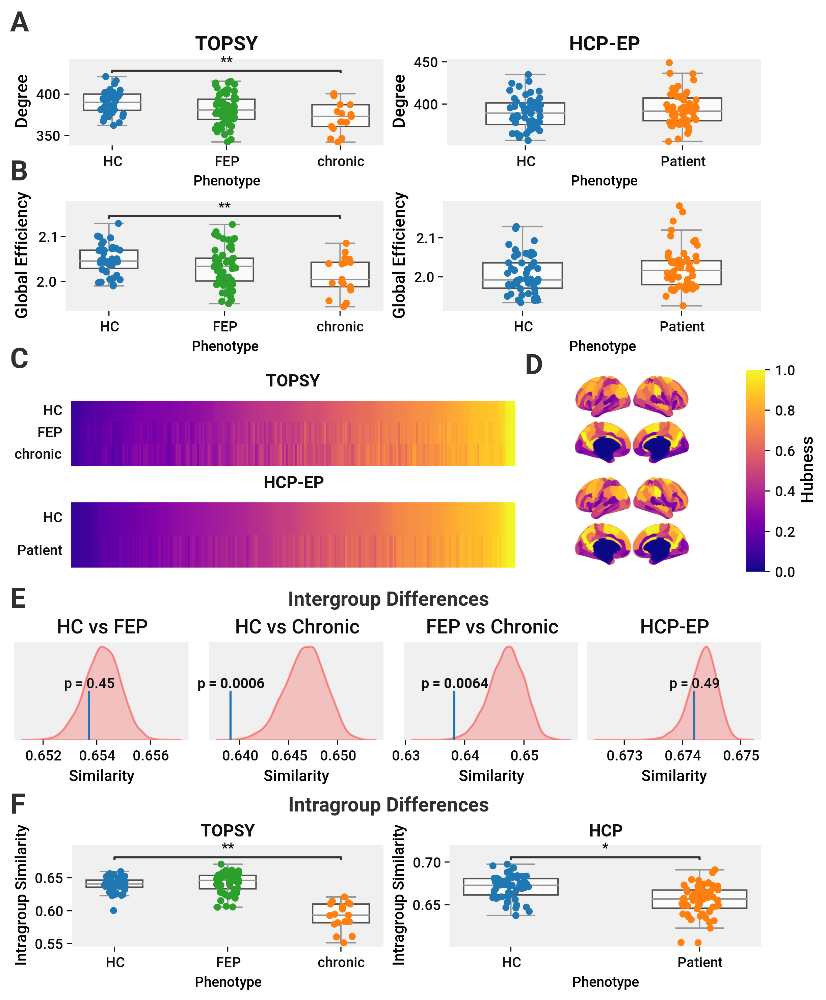

In [41]:
# | label: hubness-ranking
# | fig-cap: |
# |   Average hubness scores across group members of brainnetome atlas nodes. Nodes are
# |   sorted according to increasing hubness in healthy controls. Scores based on number
# |   of streamlines (sift2 corrected) are shown in the left column, scores based on
# |   average FA are in the right. Nodes in disease groups
# |   are shown in the same order for comparison.


fig = plt.figure(layout="constrained", figsize=(8, 9.5), facecolor="white")
grid = fig.add_gridspec(
    5, 3, width_ratios=[1.9, 0.8, 0.07], height_ratios=[0.8, 0.8, 1, 1, 1]
)


# panel A
panel_b = fig.add_subfigure(grid[0, :])
panel_b.text(0, 1, "A", **Styles.panel_label)

axs = panel_b.subplots(1, 2)
axs[0].set_title("TOPSY", fontdict=dict(weight="bold"))
axs[1].set_title("HCP-EP", fontdict=dict(weight="bold"))

topsy_order = ["HC", "FEP", "chronic"]
ax = comparison_plot(
    topsy_global,
    order=topsy_order,
    ax=axs[0],
    y="degree",
    ylabel="Degree",
    significance=topsy_lm_degree_tukey
)

hcp_order = ["HC", "Patient"]
comparison_plot(hcp_global, order=hcp_order, ax=axs[1], y="degree", ylabel="Degree")

# panel B
panel_c = fig.add_subfigure(grid[1, :])
panel_c.text(0, 1.1, "B", **Styles.panel_label)

axs = panel_c.subplots(1, 2)

ax = comparison_plot(
    topsy_global,
    order=topsy_order,
    ax=axs[0],
    y="global_eff",
    ylabel="Global Efficiency",
    significance=topsy_lm_eff_tukey
)

ax = comparison_plot(
    hcp_global, order=hcp_order, ax=axs[1], y="global_eff", ylabel="Global Efficiency"
)





# panel D
# colorab axis
cbar_ax = fig.add_subplot(grid[2, 2])

panel_c = fig.add_subfigure(grid[2, 0])
panel_c.text(0, 1.01, "C", **Styles.panel_label)
axs_b = panel_c.subplots(2, 1, sharey=False)
for (dataset, title, order), axes in zip(
    [
        (topsy_hub_data, "TOPSY", ["HC", "FEP", "chronic"]),
        (hcp_hub_data, "HCP-EP", None),
    ],
    axs_b,
):
    get_ds = lambda _weight: (
        dataset.swap_dims({"node": "node_uid"}).groupby("group").mean().sel(weight=_weight)
    )
    ds = dataset.groupby("group").mean().sel(weight="logsift2")
    plot_hubness_ranks(
        ds, sort_col="hubness", ax=axes, cbar_ax=cbar_ax, order=order
    )
    axes.set_title(
        title,
        pad=10,
        fontdict=dict(
            fontsize=12,
            fontweight="bold",
        ),
    )


# panel E
panel_a = fig.add_subfigure(grid[2, 1])
panel_a.text(0, 0.98, "D", **Styles.panel_label)
axs = panel_a.subplots(2, 1, height_ratios=[0.4, 0.4])
axs[0].imshow(imgs[0])
axs[1].imshow(imgs[1])
# subfigs = fig.subfigures(1, 2)
# axs = subfigs[0].subplots(2, 2, subplot_kw={"projection": "3d"})
for ax in axs.flat:
    ax.get_yaxis().set_visible(False)
    ax.get_xaxis().set_visible(False)
    ax.set_facecolor("#FFFFFF")

cbar_ax.set_ylabel("Hubness")

panel_c = fig.add_subfigure(grid[3, :])
panel_c.text(0, 1, "E", va="top", **Styles.panel_label)
panel_c.suptitle("Intergroup Differences", **Styles.subfig_title)
axs = panel_c.subplots(1, 4)
for ax, result, title in zip(
    axs,
    [
        hubness_intergroup.hc_to_fep,
        hubness_intergroup.hc_to_chronic,
        hubness_intergroup.fep_to_chronic,
        hubness_intergroup.hcp_patient_to_hc,
    ],
    ("HC vs FEP", "HC vs Chronic", "FEP vs Chronic", "HCP-EP"),
):
    plot_permutation_result(result, ax)
    ax.set_title(title)


panel_d = fig.add_subfigure(grid[4, :])
panel_d.text(0, 1, "F", va="top", **Styles.panel_label)
panel_d.suptitle("Intragroup Differences", **Styles.subfig_title)
axs = panel_d.subplots(1, 2)
order = ["HC", "FEP", "chronic"]
plot_intragroup_difference(
    kt_intra_topsy,
    topsy_hub_data.sel(
        weight="logsift2", subject=topsy_hub_data["group"] != "High risk"
    ),
    axs[0],
    title="TOPSY",
    order=order,
    significance={
        ("HC", "chronic"): hubness_intragroup.hc_to_chronic.pvalue,
        # ("FEP", "chronic"): fep_to_chronic.pvalue,
    },
)
plot_intragroup_difference(
    kt_intra_hcp,
    hcp_hub_data.sel(weight="logsift2"),
    axs[1],
    title="HCP",
    significance={("HC", "Patient"): hubness_intragroup.hcp_patient_to_hc.pvalue},
)

# Supplemental

## HC-Chronic Age Matching

In [43]:
topsy_nbs["model"]

<xarray.DataArray 'model' (model: 8)>
array(['neg', 'pos', 'fep', 'chronic', 'fep2chronic', 'fepI', 'chronicI',
       'chronic2fep'], dtype=object)
Coordinates:
  * model    (model) object 'neg' 'pos' 'fep' ... 'chronicI' 'chronic2fep'

In [45]:
g = graph_from_weighted_matrix(topsy_nbs.sel(model="hc2chronic", weight="avgFA"))
deg_map = g.degree_property_map("total").a

deg_ims = [plot_on_atlas(deg_map, transparent=True, vmax=np.max(deg_map))]
vmaxes = [np.max(deg_map)]


disruption_by_hubness = get_disruption_by_hubness(
    hubness=topsy_hub_data.sel(weight="logsift2")
    .groupby("group")["HC"]["hubness"]
    .mean("subject"),
    nbs=symmetrize(topsy_nbs.sel(model="hc2chronic", weight="avgFA")),
    upper=0.90,
    lower=0.1,
    res=0.02,
    kernel=0.05,
    seed=2,
).assign(model="hc2chronic")


class hc2chronic_fa_lm:
    data = (
        topsy_conmats.sel(
            weight="avgFA",
            subject=(
                (topsy_conmats["age"] > 23)
                & (
                    (topsy_conmats["group"] == "HC")
                    | (topsy_conmats["group"] == "chronic")
                )
            ),
        )
        .mean(["src", "dest"])
        .to_dataframe()
    )
    lm = ols(
        "adj ~ phenotype - 1",
        data=data,
    ).fit()
    test = lm.t_test("phenotype[HC] - phenotype[chronic]")


statresults.add_t("hc-match-chronic_fa", hc2chronic_fa_lm.test)


class hc2chronic_logsift_lm:
    data = topsy_global[
        topsy_global["phenotype"].isin(["HC", "chronic"]) & (topsy_global["age"] > 23)
    ]
    lm = ols(
        "degree ~ phenotype",
        data=data,
    ).fit()
    test = lm.t_test("phenotype[T.chronic]")

statresults.add_t("hc-match-chronic_degree", hc2chronic_logsift_lm.test)


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

HC vs. chronic: Custom statistical test, P_val:1.779e-02


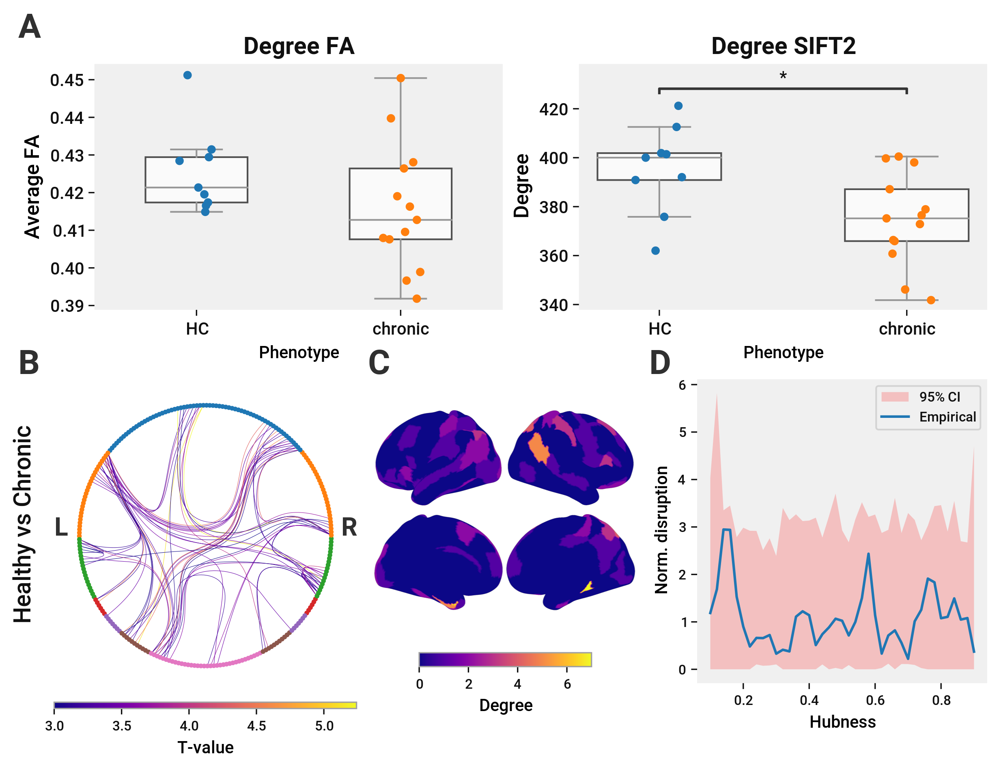

In [46]:
plt.switch_backend("cairo")
fig = plt.figure(layout="constrained", figsize=(8, 6))

subfigs = fig.subfigures(2, 1, height_ratios=[1.3, 1.5])
lower_grid = subfigs[1].add_gridspec(1, 3, width_ratios=[2.5, 2, 2.5])


# Panel A

panel_b = subfigs[0]
panel_b.text(0, 0.98, "A", **Styles.panel_label)
axs = panel_b.subplots(1, 2)
order = ["HC", "chronic"]

comparison_plot(
    hc2chronic_fa_lm.data,
    order=order,
    ax=axs[0],
)
axs[0].set_title("Degree FA", fontdict=dict(weight="bold"))

comparison_plot(
    hc2chronic_logsift_lm.data,
    order=order,
    ax=axs[1],
    y="degree",
    ylabel="Degree",
    significance={("HC", "chronic"): hc2chronic_logsift_lm.test.pvalue.item()},
)
axs[1].set_title("Degree SIFT2", fontdict=dict(weight="bold"))


# Panel B
panel_c = subfigs[1].add_subfigure(lower_grid[0])
panel_c.text(0, 1, "B", **Styles.panel_label)
axs = panel_c.subplots(2, 1, height_ratios=[1, 0.02])

max_t = np.max(topsy_nbs.sel(model="hc2chronic", weight="avgFA"))

for ax, nbs, model, title in zip(
    axs[:-1], [topsy_nbs], ["hc2chronic"], ["Healthy vs Chronic"]
):
    arr = nbs.sel(model=model, weight="avgFA")
    plot_hierachical_connectome(arr, ax=ax, atlas=Atlas.bn246, emax=max_t)
    ax.set_title(title, rotation="vertical", x=-0.1, y=0.5, va="center")
    ax.axis("off")

cbar = axs[-1]
add_colorbar(3, max_t, "plasma", cax=cbar, orientation="horizontal").set_label(
    "T-value", fontsize=10
)
cbar.yaxis.set_visible(False)
cbar.xaxis.set_tick_params(labelsize=8)


# Panel C
panel_a = subfigs[1].add_subfigure(lower_grid[1])
panel_a.text(0, 1, "C", **Styles.panel_label)
cols = panel_a.subfigures(2, 1, height_ratios=[1, 0.1])
for deg_im, vmax, col in zip(deg_ims, vmaxes, cols):
    col_grid = col.add_gridspec(
        2, 3, width_ratios=[0.1, 1, 0.1], height_ratios=[0.95, 0.05]
    )
    cbar = col.add_subplot(col_grid[1, 1])
    ax = col.add_subplot(col_grid[0, :])
    ax.imshow(deg_im)
    add_colorbar(0, vmax, "plasma", cax=cbar, orientation="horizontal").set_label(
        "Degree", fontsize=10
    )
    cbar.xaxis.set_tick_params(labelsize=8)
    
    ax.axis("off")

# Panel D
panel_d = subfigs[1].add_subfigure(lower_grid[2])
panel_d.text(0, 1, "D", **Styles.panel_label)
axs = panel_d.subplots(2, 1, height_ratios=[1, 0.05])
axs[-1].axis("off")


plot_disruption_topology(disruption_by_hubness, axs[0])

## Alternate Disruption Topology

In [57]:
def suppl_disruption_by_hubness(kernel, weight):
    return pd.concat(
        [
            get_disruption_by_hubness(
                hubness=topsy_hub_data
                .sel(weight="logsift2")
                .groupby('group')["HC"][weight]
                .mean('subject'),
                nbs=symmetrize(topsy_nbs.sel(model=model, weight='avgFA')),
                upper=0.90,
                lower=0.1,
                res=0.02,
                kernel=kernel,
                subgraph="open" if isinstance(kernel, Number) else "closed",
                seed=2,
                normalize=False,
            ).assign(model=model)
            for model in ['chronic', 'fep2chronic']
        ] +
        [
            get_disruption_by_hubness(
                hubness=hcp_hub_data
                .sel(weight="logsift2")
                .groupby('group')["HC"][weight]
                .mean('subject'),
                nbs=symmetrize(hcp_nbs.sel(model="patient", weight='avgFA')),
                upper=0.90,
                lower=0.1,
                res=0.02,
                kernel=kernel,
                subgraph="open" if isinstance(kernel, Number) else "closed",
                seed=2,
                normalize=False,
            ).assign(model="patient")
        ]
    )

disr_hub_sup = suppl_disruption_by_hubness("upper", "hubness")
disr_hub_sub = suppl_disruption_by_hubness("lower", "hubness")
disr_deg_kern = suppl_disruption_by_hubness(0.1, "degree_rank")
disr_deg_sup = suppl_disruption_by_hubness("upper", "degree_rank")
disr_deg_sub = suppl_disruption_by_hubness("lower", "degree_rank")

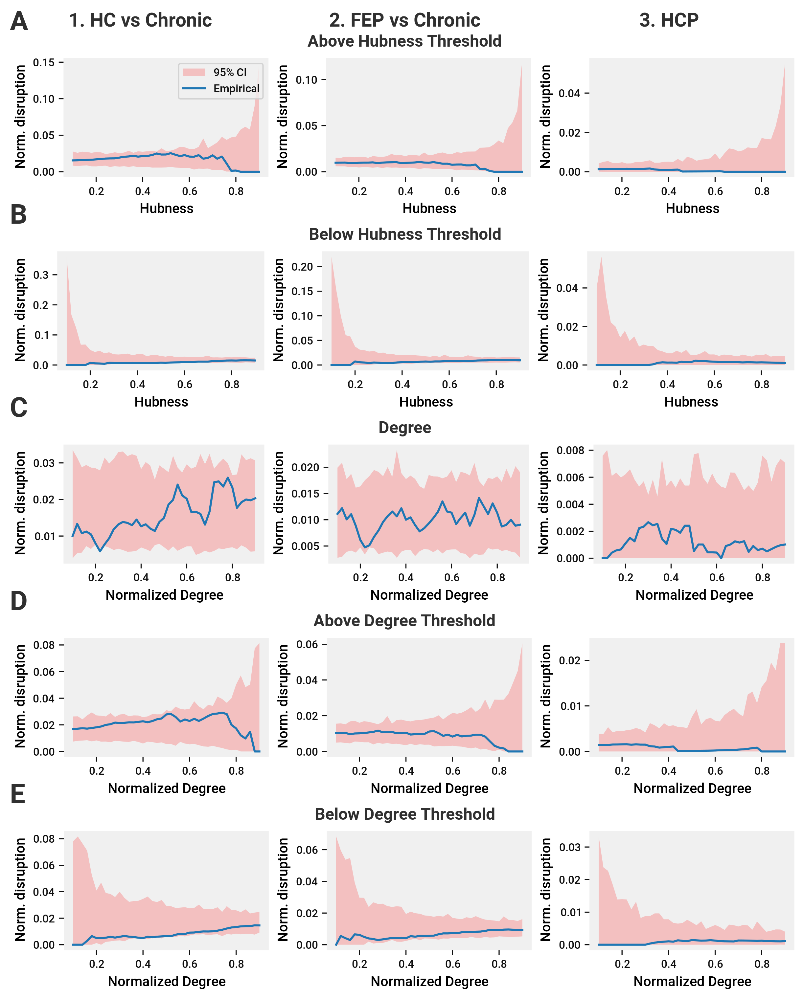

In [58]:
# order.a = np.arange(len(order.a))
# order.a[0] = 23


def iter_models(data, axs, xlabel=None, legend=False):
    for i, model in enumerate(data["model"].unique()):
        plot_disruption_topology(
            data[data["model"] == model], axs[i], xlabel=xlabel, legend=legend and not i
        )


fig = plt.figure(layout="constrained", figsize=(8, 10))
grid = fig.add_gridspec(6, 1, height_ratios=[0.1, 1, 1, 1, 1, 1])
titles = fig.add_subfigure(grid[0])
title_cols = titles.subfigures(1, 3)
title_cols[0].suptitle("1. HC vs Chronic", **Styles.col_title)
title_cols[1].suptitle("2. FEP vs Chronic", **Styles.col_title)
title_cols[2].suptitle("3. HCP", **Styles.col_title)

_row_title = {
    **Styles.subfig_title,
    "size": 12,
}
panel_b = fig.add_subfigure(grid[1])
panel_b.text(0, 1, "A", **Styles.panel_label)
panel_b.suptitle("Above Hubness Threshold", **_row_title)
axs_a = panel_b.subplots(1, 3)
iter_models(disr_hub_sup, axs_a, legend=True)

panel_c = fig.add_subfigure(grid[2])
panel_c.text(0, 1, "B", **Styles.panel_label)
panel_c.suptitle("Below Hubness Threshold", **_row_title)
axs_b = panel_c.subplots(1, 3)
iter_models(disr_hub_sub, axs_b)

panel_a = fig.add_subfigure(grid[3])
panel_a.text(0, 1, "C", **Styles.panel_label)
panel_a.suptitle("Degree", **_row_title)
axs = panel_a.subplots(1, 3)
iter_models(disr_deg_kern, axs, xlabel="Normalized Degree")

panel_d = fig.add_subfigure(grid[4])
panel_d.text(0, 1, "D", **Styles.panel_label)
panel_d.suptitle("Above Degree Threshold", **_row_title)
axs = panel_d.subplots(1, 3)
iter_models(disr_deg_sup, axs, xlabel="Normalized Degree")

panel_d = fig.add_subfigure(grid[5])
panel_d.text(0, 1, "E", **Styles.panel_label)
panel_d.suptitle("Below Degree Threshold", **_row_title)
axs = panel_d.subplots(1, 3)
iter_models(disr_deg_sub, axs, xlabel="Normalized Degree")

## Other parameters

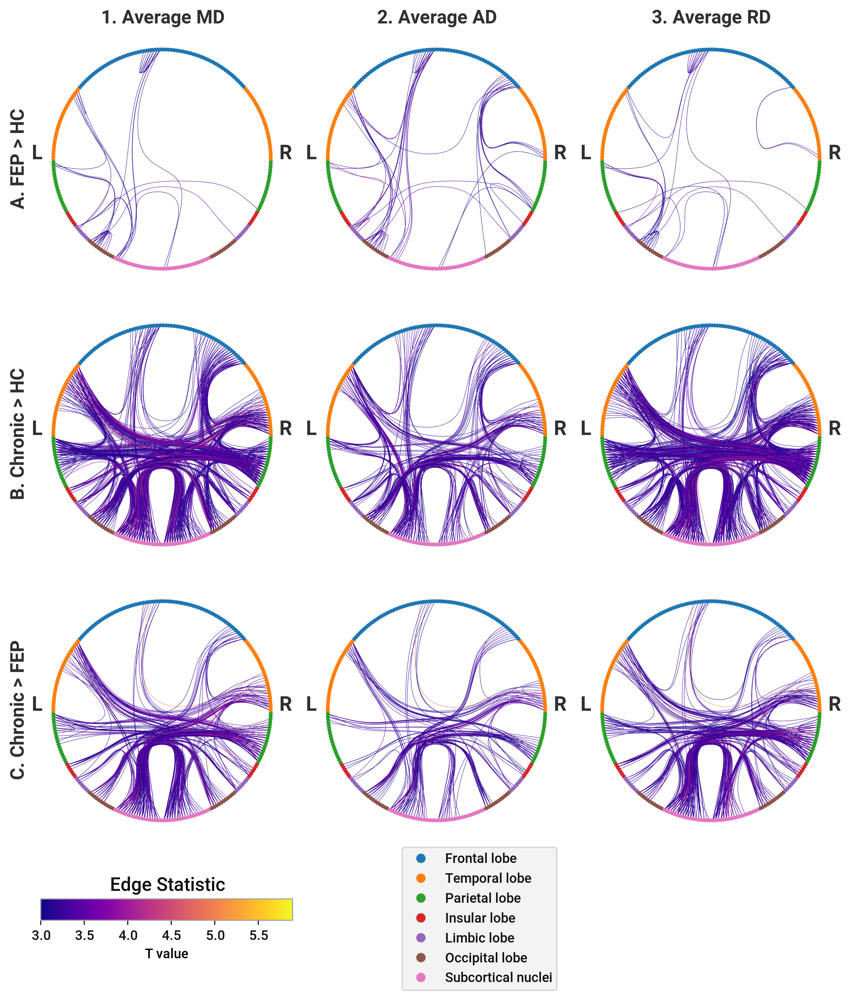

In [59]:
plt.switch_backend("cairo")
fig = plt.figure(layout="constrained", figsize=(8.5, 10), facecolor="white")

panels = fig.subfigures(4, 3, height_ratios=[1,1,1,0.5])


thresh = 3.0
max_t = np.max(topsy_nbs)

Y = [
    "fepI",
    "chronicI",
    "chronic2fep",
]
X = ["avgMD", "avgAD", "avgRD"]
titles = {
    "chronicI": "B. Chronic > HC",
    "chronic2fep": "C. Chronic > FEP",
    "fepI": "A. FEP > HC",
    "avgMD": "1. Average MD",
    "avgAD": "2. Average AD",
    "avgRD": "3. Average RD",
}
i = 0
for x, y in np.ndindex(3, 3):
    i += 1
    panel = panels[y, x]
    model = Y[y]
    param = X[x]

    if y == 0:
        panel.text(0.5, 1, titles[param], ha="center", **Styles.col_title)
    if x == 0:
        panel.text(
            0,
            0.5,
            titles[model],
            **(Styles.row_title | dict(weight="bold", color="#303030"))
        )
    # if model == "fepI" and param == "avgMD":
    #     continue
    # if model == "fepI" and param == "avgRD":
        # ax = panel.add_subplot(panel.add_gridspec(13, 1)[2])
        # add_legend(
        #     panel,
        #     labels=Atlas.bn246["Lobe"].unique(),
        #     cmap=cm.tab10,
        #     prop={"size": 10},
        #     bbox_to_anchor=(0.5, 0.1),
        #     loc="lower center",
        # )
        # add_colorbar(3, vmax, "plasma", cax=ax, orientation="horizontal").set_label(
        #     "T value", **Styles.colorbar_label
        # )

        # continue
    ax = panel.subplots(1, 1)
    ax.axis("off")
    plot_hierachical_connectome(
        topsy_nbs.sel(model=model, weight=param),
        ax=ax,
        ecmap=cm.plasma,
        atlas=Atlas.bn246,
        vcmap=cm.tab10,
        emax=max_t,
    )

cbar = panels[-1, 0].add_subplot(3,1,2)
cbar.set_title("Edge Statistic")
add_colorbar(3, max_t, "plasma", cax=cbar, orientation="horizontal").set_label(
    "T value", **Styles.colorbar_label
)
add_legend(
    panels[-1, 1],
    labels=Atlas.bn246["Lobe"].unique(),
    cmap=cm.tab10,
    prop={"size": 10},
    bbox_to_anchor=(0.66, 0.5),
    loc="center",
)

## Topology Extended

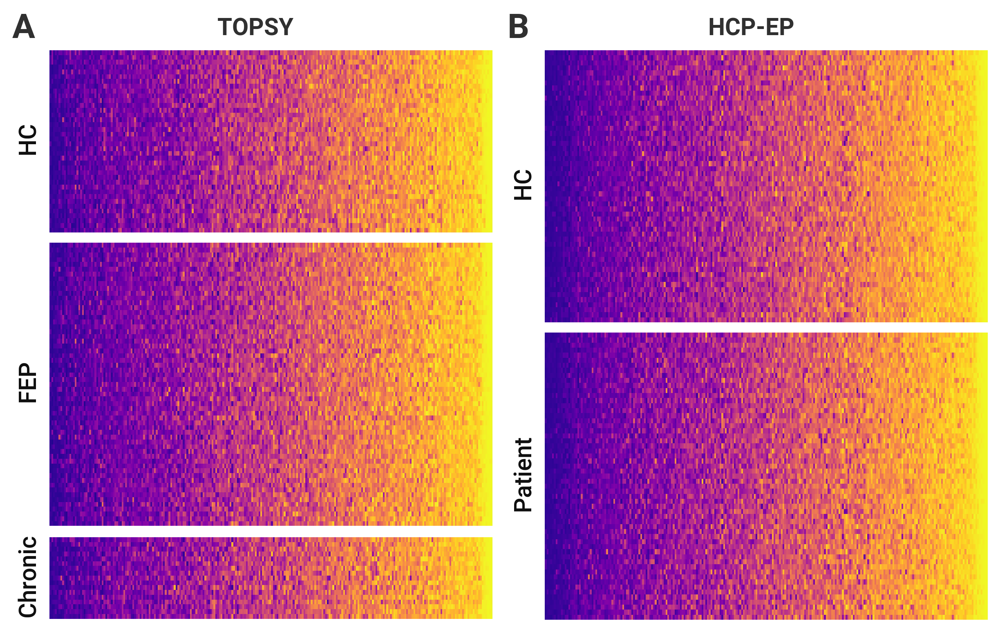

In [60]:
fig = plt.figure(figsize=(8, 5), layout="constrained")
# Panel A
subpanels = fig.subfigures(1, 2)
subpanels[0].text(0, 1, "A", va="top", **Styles.panel_label)
subpanels[1].text(0, 1, "B", va="top", **Styles.panel_label)
for (dataset, title, order), panel in zip(
    [
        (topsy_hub_data, "TOPSY", ["HC", "FEP", "chronic"]),
        (hcp_hub_data.sortby("group"), "HCP-EP", None),
    ],
    subpanels,
):
    ds = dataset.sel(weight="logsift2")
    if order is None:
        order = np.unique(ds["group"])
    groupby = ds.groupby("group")
    axs = panel.subplots(
        len(groupby.groups),
        1,
        height_ratios=[len(groupby.groups[label]) for label in order],
    )
    for ax, label in zip(axs, order):
        plot_hubness_ranks(
            groupby[label],
            y="subject",
            sort_col="hubness",
            ax=ax,
            sort_by=ds["hubness"].mean("subject"),
            cbar=False,
            # cbar_ax=cbar_ax,
        )
        ax.get_yaxis().set_visible(False)
        ax.text(
            -0.02,
            0.5,
            label[0].capitalize() + label[1:],
            transform=ax.transAxes,
            **Styles.row_title
        )
    panel.suptitle(title, **Styles.col_title)



Text(0.5, 0.99, 'B. HCP-EP')

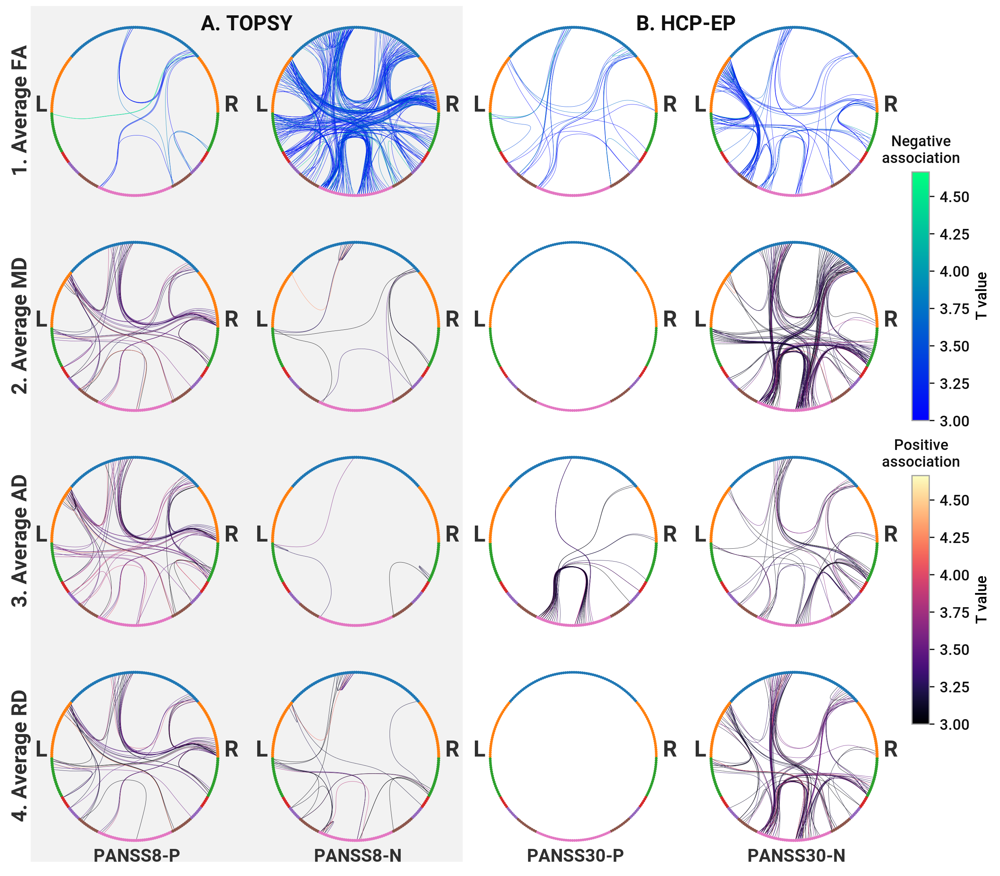

In [63]:
plt.switch_backend("cairo")
fig = plt.figure(layout="constrained", figsize=(9, 8), facecolor="white")

panels = fig.subfigures(1, 3, width_ratios=[1, 1, 0.2])
left = panels[0].subfigures(4, 2)
right = panels[1].subfigures(4, 2)


thresh = 3.0

Y = ["FA", "MD", "AD", "RD"]
X = ["panssp", "panssn"]
max_t = np.max(hcp_nbs.sel(model=["pos", "neg"]))
models = {"FA": "neg", "MD": "pos", "AD": "pos", "RD": "pos"}
titles = {
    "neg": "Neg",
    "panssp": "PANSS{var}-P",
    "panssn": "PANSS{var}-N",
    "panssg": "PANSS-G",
    "pansst": "PANSS-TOTAL",
    "FA": "1. Average FA",
    "MD": "2. Average MD",
    "AD": "3. Average AD",
    "RD": "4. Average RD",
}
i = 0
for (frame, data), (x, y) in it.product(
    [(left, topsy_nbs), (right, hcp_nbs)], np.ndindex(2, 4)
):
    i += 1
    panel = frame[y, x]
    model = Y[y]
    param = X[x]

    var = "30" if data is hcp_nbs else "8"
    if y == 3:
        panel.text(
            0.5,
            0,
            titles[param].format(var=var),
            ha="center",
            **{**Styles.col_title, "size": 12},
        )
    if x == 0 and frame is not right:
        panel.text(
            0,
            0.5,
            titles[model],
            **(Styles.row_title | dict(weight="bold", color="#303030")),
        )
    ax = panel.subplots(1, 1)
    ax.axis("off")
    plot_hierachical_connectome(
        data.sel(model=models[model], weight=f"{model}{param}"),
        ax=ax,
        ecmap={
            "neg": cm.winter,
            "pos": cm.magma,
        }[models[model]],
        atlas=Atlas.bn246,
        vcmap=cm.tab10,
        emax=max_t,
    )

grid = panels[-1].add_gridspec(6, 1)
cbar1 = panels[-1].add_subplot(grid[1:3])
cbar2 = panels[-1].add_subplot(grid[3:5])
cbar1.set_title("Negative\nassociation", size=10)
cbar2.set_title("Positive\nassociation", size=10)
add_colorbar(3, max_t, "winter", cax=cbar1, orientation="vertical").set_label(
    "T value", **Styles.colorbar_label
)
add_colorbar(3, max_t, "magma", cax=cbar2, orientation="vertical").set_label(
    "T value", **Styles.colorbar_label
)
panels[0].set_facecolor("#f2f2f2")
panels[0].suptitle("A. TOPSY", y=0.99)
panels[1].suptitle("B. HCP-EP", y=0.99)
# add_legend(
#     panels[2, -1],
#     labels=Atlas.bn246["Lobe"].unique(),
#     cmap=cm.tab10,
#     prop={"size": 10},
#     bbox_to_anchor=(0.5, 0),
#     loc="center",
# )

<Axes: xlabel='PANSS8-N', ylabel='Average FA'>

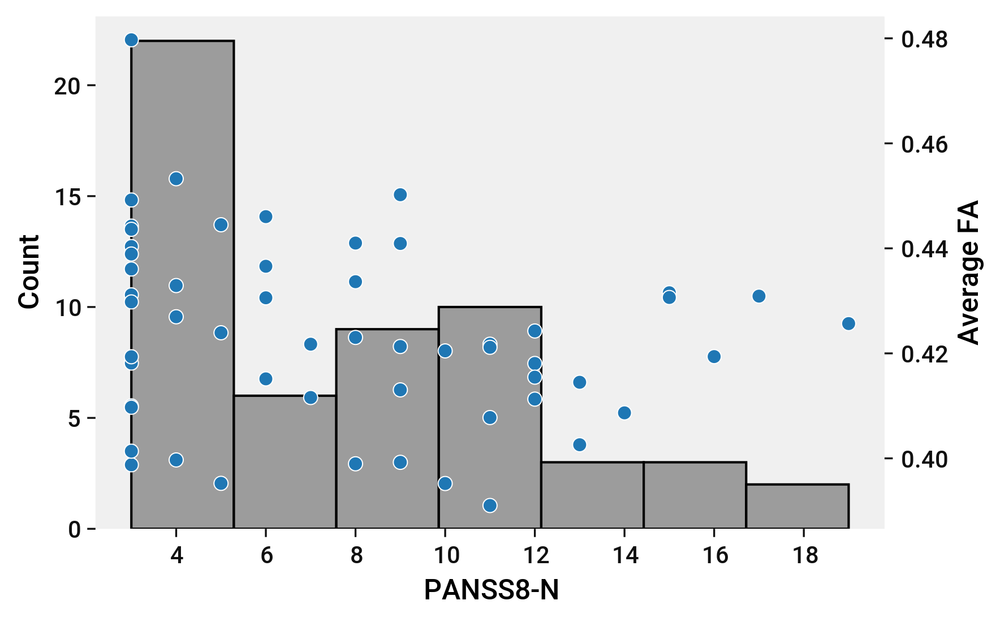

In [19]:
fig, ax1 = plt.subplots()
ax1.set_ylabel('Count')
ax2 = ax1.twinx()
ax2.set_ylabel('Average FA')
df = (
    topsy_conmats.sel(weight="avgFA")
    .groupby("group")["FEP"][["adj", "PANSS8-N"]]
    .mean(["src", "dest"])
    .to_dataframe()
)
sns.histplot(df["PANSS8-N"], ax=ax1, color="grey")
sns.scatterplot(df, y="adj", x="PANSS8-N", ax=ax2)

In [37]:
param = "PANSS-P"
df = (
    hcp_wm.sel(desc="FA")
    .groupby("group")["Patient"][["data", param]]
    # .where(lambda da: da[param] > 3, drop=True)
    .to_dataframe()
)
df

model = smf.ols(f"data ~ Q('{param}')", df).fit()
t = model.t_test(f"Q('{param}')")
print(model.summary())

                            OLS Regression Results                            
Dep. Variable:                   data   R-squared:                       0.000
Model:                            OLS   Adj. R-squared:                 -0.018
Method:                 Least Squares   F-statistic:                 6.777e-06
Date:                Sat, 09 Mar 2024   Prob (F-statistic):              0.998
Time:                        13:04:42   Log-Likelihood:                 155.99
No. Observations:                  57   AIC:                            -308.0
Df Residuals:                      55   BIC:                            -303.9
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                   coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------
Intercept        0.4191      0.007     60.262   

In [51]:
for weight, param in it.product(
    ["avgFA", "avgMD", "avgRD", "avgL1"], ["PANSS-P", "PANSS-N", "PANSS-G"]
):
    df = (
        hcp_conmats.sel(weight=weight)
        .groupby("group")["Patient"][["adj", param]]
        .mean(["src", "dest"])
        .to_dataframe()
    )

    model = smf.ols(f"adj ~ Q('{param}')", df).fit()
    t = model.t_test(f"Q('{param}')")
    if t.pvalue <= 0.05:
        print(weight)
        print(model.summary())

avgMD
                            OLS Regression Results                            
Dep. Variable:                    adj   R-squared:                       0.073
Model:                            OLS   Adj. R-squared:                  0.055
Method:                 Least Squares   F-statistic:                     4.222
Date:                Fri, 08 Mar 2024   Prob (F-statistic):             0.0447
Time:                        21:44:59   Log-Likelihood:                 562.51
No. Observations:                  56   AIC:                            -1121.
Df Residuals:                      54   BIC:                            -1117.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                   coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------
Intercept        0.0004   4.52e-06     96.

In [71]:
topsy_nbs.sel(model="neg", weight=["FApanssn", "ADpanssn", "RDpanssn"]).sum(["src", "dest"])

<xarray.DataArray (weight: 3)>
array([1027.57780753, 1027.57780753, 1027.57780753])
Coordinates:
  * weight   (weight) object 'FApanssn' 'ADpanssn' 'RDpanssn'
    model    <U3 'neg'

In [74]:
statresults

global-vox-hcp_fa_chronic: $t(109) = -2.42, p = .017$
global-vox-hcp_rd: '$F(1,\, 109) = 4.78,\: p = .031$'
global-vox-hcp_rd_chronic: $t(109) = 2.19, p = .031$
global-vox_md: '$F(2,\, 111) = 3.22,\: p = .044$'
global-vox_md_hc_chronic: $p = .036$
global-vox_rd: '$F(2,\, 111) = 3.78,\: p = .026$'
global-vox_rd_hc_chronic: $p = .02$

In [61]:
src_md = (
    Atlas.bn246.set_index("Label ID")
    .add_prefix("src_")
    .to_xarray()
    .rename({"Label ID": "src"})
)
dest_md = (
    Atlas.bn246.set_index("Label ID")
    .add_prefix("dest_")
    .to_xarray()
    .rename({"Label ID": "dest"})
)
da = (
    (topsy_nbs > 0)
    .stack({"comp": ["weight", "model"]})
    .where(lambda da: da.sum(["src", "dest"]), drop=True)
    .to_dataset(name="connections")
    .merge(src_md)
    .merge(dest_md)
)
da["counts"] = da["connections"].sum(["src", "dest"])
print(da["counts"].to_series().to_csv(sep="\t"))
# da["interhemispheric"] = 
# (
#     da.sel(src=da["src_hemisphere"] == "L")
#     da.groupby("src_hemisphere")["L"].groupby("dest_hemiphere")["L"]["connections"] +
#     da.groupby("src_hemisphere")["L"].groupby("dest_hemiphere")["L"]["connections"]

# )


weight	model	counts
avgAD	fep	5.0
avgAD	chronic	60.0
avgAD	fep2chronic	55.0
avgAD	fepI	74.0
avgAD	chronicI	298.0
avgAD	chronic2fep	119.0
avgFA	hc2chronic	85.0
avgFA	fep	61.0
avgFA	chronic	471.0
avgFA	fep2chronic	278.0
avgMD	fep	6.0
avgMD	chronic	48.0
avgMD	fep2chronic	46.0
avgMD	fepI	55.0
avgMD	chronicI	791.0
avgMD	chronic2fep	347.0
avgRD	fep	5.0
avgRD	chronic	9.0
avgRD	fep2chronic	31.0
avgRD	fepI	42.0
avgRD	chronicI	820.0
avgRD	chronic2fep	353.0
sift2	fep	117.0
sift2	chronic	396.0
sift2	fep2chronic	307.0



In [64]:
import nibabel as nb
skeletonized = nb.load(
    BIDSLayout(
        Path(topsy.layout.derivatives["snakemodel"].root),
        indexer=BIDSLayoutIndexer(ignore=[".git", ".snakemake"]),
        validate=False,
        is_derivative=True,
    ).get(desc="FA", suffix="skeletonized")[0]
)
total_vox = np.sum(skeletonized.get_fdata() > 0)
results = []
for param, model in [
    ("md", "chronicI"),
    ("rd", "chronicI"),
    ("md", "fepI"),
]:
    data = nb.load(
        stats.get(
            scope="snakemodel",
            subject=None,
            model="tbss",
            desc=param,
            label=model,
            suffix="corrp",
        )[0]
    ).get_fdata()
    num_voxels = np.sum(data > 0.95)
    results.append({
        "Model": model,
        "Parameter": param,
        "Num": num_voxels,
        "Extent": num_voxels / total_vox * 100,
        "Volume": num_voxels * 8

    })
print(pd.DataFrame(results).to_csv(sep="\t"))

	Model	Parameter	Num	Extent	Volume
0	chronicI	md	0	0.0	0
1	chronicI	rd	47	0.33935018050541516	376
2	fepI	md	142	1.0252707581227438	1136

